In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
import math
import copy
import sys
import os
import platform
import itertools
from collections import Counter

from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

In [3]:
'''
if platform.system() == 'Darwin':
    user = 'joewandy'
    user_vimms = '/Users/%s/Work/git/vimms' % user
    mzmine_path = '/Users/%s/MZmine-2.53-macOS/startMZmine-macOS' % user
elif platform.system() == 'Windows':
    user = 'joewa'
    user_vimms = '/Users/%s/Work/git/vimms' % user
    mzmine_path = '/Users/%s/MZmine-2.53-Windows/startMZmine-Windows.bat' % user
'''

user_vimms = os.path.join("C:\\", "Users", "mcbrider5002", "Desktop", "Workspace", "phd", "peak_picking", "vimms")
mzmine_path = os.path.join("C:\\", "Users", "mcbrider5002", "Desktop", "Workspace", "phd", "peak_picking", "MZmine-2.53-Windows", "startMZmine-Windows.bat")

In [4]:
sys.path.append(user_vimms)
old_mzmine = False
template_suffix = "_old" if old_mzmine else ""
template_name = "Permissive" if old_mzmine else "Restrictive"
mzmine_template = os.path.join(user_vimms, "batch_files", f"multi_sample_peak_pick{template_suffix}.xml")
print(mzmine_template)

C:\Users\mcbrider5002\Desktop\Workspace\phd\peak_picking\vimms\batch_files\multi_sample_peak_pick.xml


In [5]:
from vimms.Common import load_obj, path_or_mzml, get_avg_scan_times
from vimms.Evaluation import (
    pick_aligned_peaks, evaluate_real
)
from vimms.BoxVisualise import (
    PlotPoints, PlotBox,
    EnvPlotPickler,
    mpl_set_axis_style, mpl_set_figure_style,
    mpl_results_plot, plotly_results_plot,
    mpl_fragmentation_counts,
    plotly_timing_hist, seaborn_timing_hist,
    seaborn_mzml_timing_hist,
    mpl_fragmentation_events, plotly_fragmentation_events,
    mpl_fragmented_boxes,
    seaborn_uncovered_area_hist,
    BoxViewer,
    boxes2csv, csv2boxes
)

In [6]:
mpl_colours = plt.rcParams["axes.prop_cycle"].by_key()["color"]
colour_iterator = itertools.cycle(mpl_colours)
colour_map = {
    "topN" : mpl_colours[5],
    "topN_RoI" : mpl_colours[7],
    "topN_exclusion" : mpl_colours[1],
    "topNEx" : mpl_colours[2],
    "hard_roi_exclusion" : mpl_colours[0],
    "intensity_roi_exclusion" : mpl_colours[8],
    "non_overlap" : mpl_colours[6],
    "intensity_non_overlap" : mpl_colours[3]   
}

def update_cmap(name):
    if(not name in colour_map):
        colour_map[name] = next(mpl_colours)
    return colour_map[name]

def get_style(name):
    if(name.lower().endswith("smartroi")):
        c = update_cmap("_".join(name.split("_")[:-1]))
        return c, "s"
    elif(name.lower().endswith("weighteddew")):
        c = update_cmap("_".join(name.split("_")[:-1]))
        return c, "^"
    else:
        c = update_cmap(name)
        return c, "o"
    
def get_line_styles(case_names):
    colours, markers = [], []
    for case_name in case_names:
        c, m = get_style(case_name)
        colours.append(c)
        markers.append(m)
    return colours, markers

In [7]:
name_map = {
    "topN" : "TopN",
    "topN_RoI" : "TopN RoI",
    "topN_exclusion" : "TopN Exclusion",
    "topNEx" : "TopNEx",
    "hard_roi_exclusion" : "Hard RoI Exclusion",
    "intensity_roi_exclusion" : "Intensity RoI Exclusion",
    "non_overlap" : "Non-Overlap",
    "intensity_non_overlap" : "Intensity Non-Overlap",   
}

In [8]:
fig_kwargs = {
    "tick_kwargs" : {
        "width" : 2.5,
        "length" : 12,
        "labelsize" : 22,
    },
    
    "axis_borderwidth" : 2.5,
    
    "axis_kwargs" : {
        "labelsize" : 24,
        "titlesize" : 24,
        "linewidth" : 1.5,
        "markersize" : 6,
        "legend_kwargs" : {
            "fontsize" : 11,
        }
    },
    
    "suptitle" : "Default Suptitle",
    "suptitle_size" : 18,
    "figure_sizes" : (18, 8),
}

# 1. Same Beer

In [9]:
#data_dir = f"/Users/{user}/University of Glasgow/Vinny Davies - CLDS Metabolomics Project/Experimental_Results/20220719_multi_samples_main"
data_dir = os.path.join("C:\\", "Users", "mcbrider5002", "Desktop", "Workspace", "phd", "data", "CLMS", "20220719_multi_samples_main")
out_dir = "real_same_beer"

repeat = 10
fullscan_names = [f"fullscan_beer{i}_0.mzML" for i in range(1, repeat+1)]
fullscan_files = {
    3 : [os.path.join(data_dir, "results_3", fs) for fs in fullscan_names]
}
print(fullscan_files)

same_case_names = [
    "topN_exclusion",
    "non_overlap",
    "intensity_non_overlap"
]

line_colours, line_markers = get_line_styles(same_case_names)

{3: ['C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_3\\fullscan_beer1_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_3\\fullscan_beer2_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_3\\fullscan_beer3_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_3\\fullscan_beer4_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_3\\fullscan_beer5_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_3\\fullscan_beer6_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_3\\fullscan_beer7_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_3\\ful

In [10]:
peak_picking_outdir = out_dir
to_align = [fullscan_files[3][0]]
aligned_name = aligned_names = f"multibeers_1_{repeat}" + template_suffix

aligned_file = pick_aligned_peaks(
    to_align,
    peak_picking_outdir,
    aligned_name,
    mzmine_template,
    mzmine_path,
    force=False
)

2143 aligned boxes contained in file


In [11]:
mzml_files = {
    case_name : [
        (
            fullscan_files[3][0], 
            os.path.join(data_dir, f"results_3", f"{case_name}_beer1_{i}.mzML")
        ) 
        for i in range(repeat)
    ]
    for case_name in same_case_names
}

files = mzml_files[same_case_names[-1]]
for fs, mzml in files:
    print(f"FULLSCAN: {fs}")
    print(f"FRAGMENTATION: {mzml}")
    print()

FULLSCAN: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer1_0.mzML
FRAGMENTATION: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\intensity_non_overlap_beer1_0.mzML

FULLSCAN: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer1_0.mzML
FRAGMENTATION: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\intensity_non_overlap_beer1_1.mzML

FULLSCAN: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer1_0.mzML
FRAGMENTATION: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\intensity_non_overlap_beer1_2.mzML

FULLSCAN: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer1_0.mzML
FRAGMENTATION: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\202207

In [12]:
same_evals = {}
for case_name in same_case_names:
    mzmls = mzml_files[case_name]
    same_evals[case_name] = evaluate_real(aligned_file, mzmls, isolation_width=0.7)
    print(case_name)
    print(same_evals[case_name].summarise(min_intensity=5000.0))
    print()

2023-05-10 12:14:31.054 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6678 scans
2023-05-10 12:14:34.771 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5167 scans
2023-05-10 12:14:39.423 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4521 scans
2023-05-10 12:14:44.475 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4273 scans
2023-05-10 12:14:49.869 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4080 scans
2023-05-10 12:14:55.572 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5316 scans
2023-05-10 12:15:00.060 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4701 scans
2023-05-10 12:15:05.104 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3904 scans
2023-05-10 12:15:11.175 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3879 scans
2023-05-10 12:15:17.112 | DEBUG    | mass_spec_utils.da

topN_exclusion


2023-05-10 12:15:23.055 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6678 scans
2023-05-10 12:15:25.300 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5167 scans
2023-05-10 12:15:27.617 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4521 scans
2023-05-10 12:15:29.811 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4273 scans
2023-05-10 12:15:32.033 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4080 scans
2023-05-10 12:15:34.509 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5316 scans
2023-05-10 12:15:36.738 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4701 scans
2023-05-10 12:15:39.074 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3904 scans
2023-05-10 12:15:41.333 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3879 scans
2023-05-10 12:15:43.546 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [6330, 4124, 3199, 2823, 2559, 4262, 3347, 2277, 2253, 2198]
Cumulative coverage: [1414, 1810, 1977, 2045, 2073, 2100, 2115, 2123, 2124, 2127]
Cumulative coverage proportion: [0.6632270168855535, 0.848968105065666, 0.9272983114446529, 0.9591932457786116, 0.9723264540337712, 0.9849906191369606, 0.9920262664165104, 0.9957786116322702, 0.9962476547842402, 0.9976547842401501]
Cumulative intensity proportion: [0.3011333201756333, 0.43789439647274336, 0.5023544274141748, 0.5367326559992646, 0.5549937230567688, 0.59810032885174, 0.6239402757849593, 0.6328084787226262, 0.6374998147501572, 0.6446272507927512]
Cumulative intensity proportion of covered spectra: [0.4540426015660893, 0.5157960515358502, 0.5417398276413863, 0.5595667592129253, 0.5707894923092286, 0.6072142386247189, 0.6289553985690464, 0.6354911336018083, 0.6399009439959206, 0.6461425945886908]
Times covered: {0: 16, 1: 287, 2: 418, 3: 392, 4: 337, 5: 271, 6: 193, 7: 118, 8: 71, 9: 31, 10: 9}
Times fragmen

2023-05-10 12:15:46.330 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6240 scans
2023-05-10 12:15:50.039 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6160 scans
2023-05-10 12:15:53.698 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6149 scans
2023-05-10 12:15:57.511 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6162 scans
2023-05-10 12:16:01.204 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6153 scans
2023-05-10 12:16:04.902 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6127 scans
2023-05-10 12:16:08.533 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6111 scans
2023-05-10 12:16:12.226 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5974 scans
2023-05-10 12:16:15.968 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6160 scans
2023-05-10 12:16:19.751 | DEBUG    | mass_spec_utils.da

non_overlap


2023-05-10 12:16:23.159 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6240 scans
2023-05-10 12:16:25.565 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6160 scans
2023-05-10 12:16:27.811 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6149 scans
2023-05-10 12:16:30.218 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6162 scans
2023-05-10 12:16:32.463 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6153 scans
2023-05-10 12:16:34.717 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6127 scans
2023-05-10 12:16:37.191 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6111 scans
2023-05-10 12:16:39.461 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5974 scans
2023-05-10 12:16:41.901 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6160 scans
2023-05-10 12:16:44.168 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [5941, 5863, 5848, 5866, 5858, 5833, 5812, 5641, 5864, 5692]
Cumulative coverage: [1413, 1851, 1987, 2053, 2082, 2095, 2103, 2108, 2110, 2111]
Cumulative coverage proportion: [0.6652542372881356, 0.8714689265536724, 0.9354990583804144, 0.966572504708098, 0.980225988700565, 0.986346516007533, 0.9901129943502824, 0.992467043314501, 0.9934086629001884, 0.993879472693032]
Cumulative intensity proportion: [0.39228389440227357, 0.5752044810281409, 0.6478094981794629, 0.6882530516629825, 0.7159756927084688, 0.7313065571145003, 0.7455827656738846, 0.7575028193476928, 0.7648126587683919, 0.7732945227681863]
Cumulative intensity proportion of covered spectra: [0.5896751533690227, 0.6600401500290498, 0.6924747730916856, 0.7120552760507427, 0.7304190063942304, 0.741429655041145, 0.7530279573425254, 0.7632523663636146, 0.7698872451298884, 0.7780566396777016]
Times covered: {0: 32, 1: 81, 2: 182, 3: 287, 4: 355, 5: 341, 6: 309, 7: 217, 8: 159, 9: 107, 10: 73}
Times fragment

2023-05-10 12:16:47.025 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6220 scans
2023-05-10 12:16:50.739 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6222 scans
2023-05-10 12:16:54.467 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6216 scans
2023-05-10 12:16:58.187 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6165 scans
2023-05-10 12:17:01.955 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6188 scans
2023-05-10 12:17:05.735 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6199 scans
2023-05-10 12:17:09.364 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6128 scans
2023-05-10 12:17:13.215 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6157 scans
2023-05-10 12:17:16.841 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6133 scans
2023-05-10 12:17:20.743 | DEBUG    | mass_spec_utils.da

intensity_non_overlap


2023-05-10 12:17:24.159 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6220 scans
2023-05-10 12:17:26.490 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6222 scans
2023-05-10 12:17:29.087 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6216 scans
2023-05-10 12:17:31.431 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6165 scans
2023-05-10 12:17:33.825 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6188 scans
2023-05-10 12:17:36.190 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6199 scans
2023-05-10 12:17:38.542 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6128 scans
2023-05-10 12:17:40.900 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6157 scans
2023-05-10 12:17:43.226 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6133 scans
2023-05-10 12:17:45.560 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [5922, 5923, 5918, 5857, 5891, 5901, 5821, 5861, 5839, 5808]
Cumulative coverage: [1365, 1764, 1944, 2019, 2051, 2074, 2095, 2100, 2108, 2110]
Cumulative coverage proportion: [0.6438679245283019, 0.8320754716981132, 0.9169811320754717, 0.9523584905660377, 0.9674528301886792, 0.9783018867924528, 0.9882075471698113, 0.9905660377358491, 0.9943396226415094, 0.9952830188679245]
Cumulative intensity proportion: [0.36860021119773445, 0.5708872033713782, 0.6729324787568373, 0.7322791190212601, 0.768654780450538, 0.8014352565209827, 0.826497694512632, 0.8408172513642386, 0.856187064632804, 0.8685939789312549]
Cumulative intensity proportion of covered spectra: [0.5724779836917194, 0.6861002670903186, 0.7338564068747402, 0.7689112096706644, 0.794513961265305, 0.8192105804361057, 0.8363604354972696, 0.8488250347105646, 0.861060994792004, 0.8727105380731092]
Times covered: {0: 33, 1: 64, 2: 143, 3: 234, 4: 244, 5: 287, 6: 267, 7: 263, 8: 207, 9: 191, 10: 210}
Times fragme

In [13]:
names = ["topN_exclusion", "non_overlap_weighteddew", "intensity_non_overlap_weighteddew"]
markersize = 11
legend_elements = [
    Line2D([0], [0], marker="o", color="black", label="Standard DEW", markerfacecolor="black", markersize=markersize),
    Line2D([0], [0], marker="^", color="black", label="WeightedDEW", markerfacecolor="black", markersize=markersize),
    Line2D([0], [0], color="white", label="", markerfacecolor="black", markersize=markersize),
]

for name in same_case_names:
    legend_elements.append(
        Line2D([0], [0], marker="s", color="white", label=name_map[name], markerfacecolor=colour_map[name], markersize=14)
    )
    
kwargs = {
    **fig_kwargs,
    "axis_kwargs" : {
        **fig_kwargs["axis_kwargs"],
        "legend_kwargs" : {
            **fig_kwargs["axis_kwargs"]["legend_kwargs"],
            "loc" : "lower right",
            "handles" : legend_elements
        },
    },
    "suptitle" : "Repeated Same Beer", "suptitle_size" : 26
}

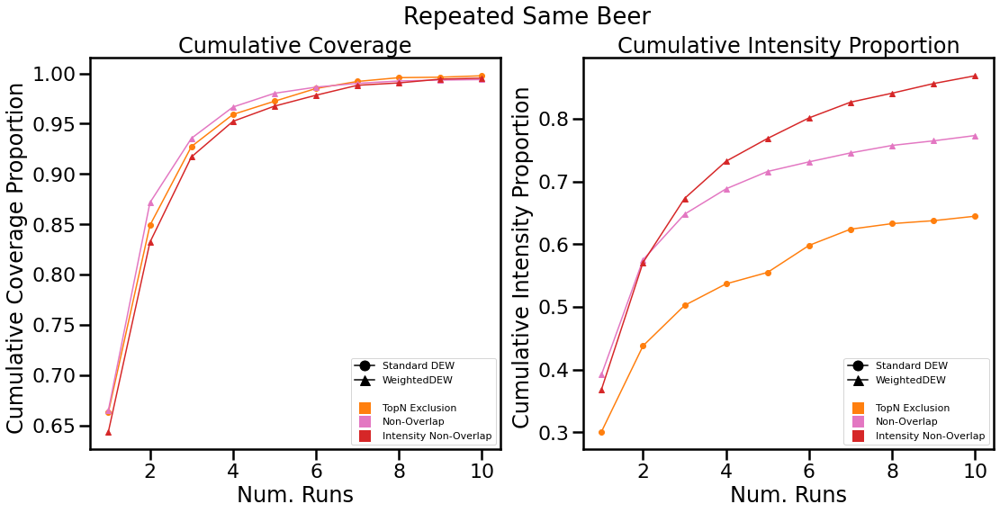

In [14]:
fig, axes = mpl_results_plot(
    names,
    [same_evals[case_name] for case_name in same_case_names],
    min_intensity=5000.0,
    colours=[colour_map[case_name] for case_name in same_case_names],
    markers=["o", "^", "^"],
)

mpl_set_figure_style(fig, **kwargs)

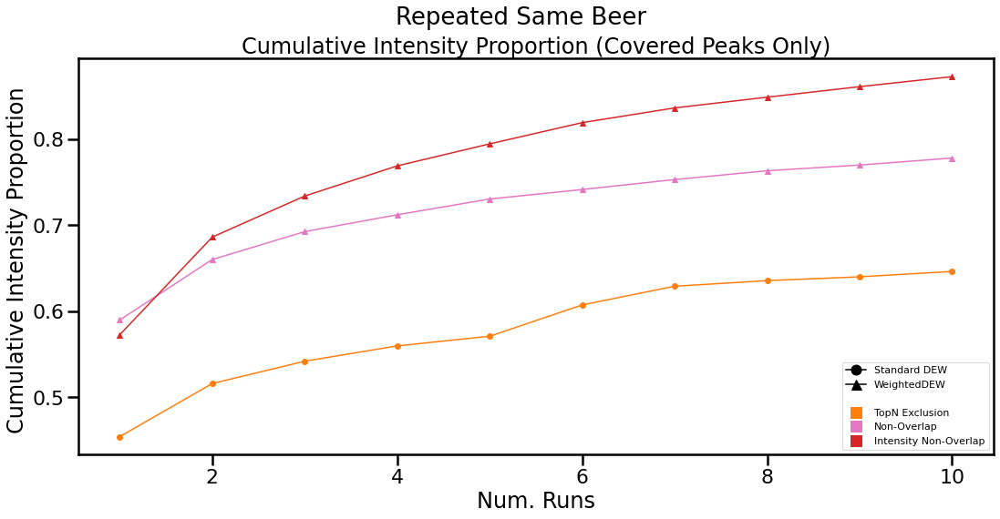

In [15]:
fig, axes = mpl_results_plot(
    names,
    [same_evals[case_name] for case_name in same_case_names],
    min_intensity=5000.0,
    colours=[colour_map[case_name] for case_name in same_case_names],
    markers=["o", "^", "^"],
    keys=["cumulative_covered_intensities_proportion"]
)

mpl_set_figure_style(fig, **kwargs)

In [16]:
plotly_results_plot(
    names,
    [same_evals[case_name] for case_name in same_case_names],
    min_intensity=5000.0,
    suptitle=f"Repeated Same Beer"
)

2023-05-10 12:17:49.859 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6678 scans
2023-05-10 12:17:52.025 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5167 scans
2023-05-10 12:17:54.469 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4521 scans
2023-05-10 12:17:56.897 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4273 scans
2023-05-10 12:17:58.983 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4080 scans
2023-05-10 12:18:01.637 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5316 scans
2023-05-10 12:18:04.064 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4701 scans
2023-05-10 12:18:06.463 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3904 scans
2023-05-10 12:18:08.522 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3879 scans
2023-05-10 12:18:11.099 | DEBUG    | mass_spec_utils.da

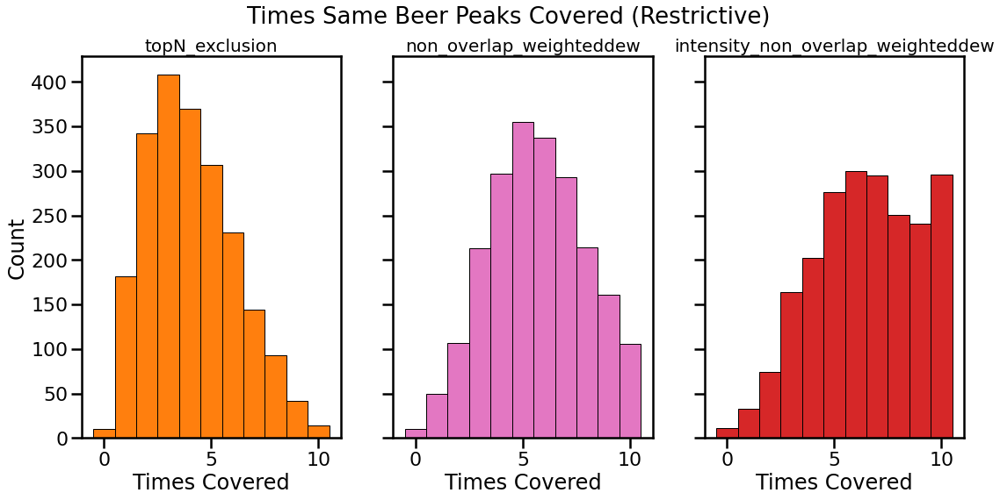

In [17]:
cases = ["topN_exclusion", "non_overlap_weighteddew", "intensity_non_overlap_weighteddew"]

evals = [same_evals[case_name] for case_name in ["topN_exclusion", "non_overlap", "intensity_non_overlap"]]
colours = [get_style(case_name)[0] for case_name in cases]

fig, axes = mpl_fragmentation_counts(
    evals,
    min_intensity=0.0, 
    key="times_covered_summary", 
    fcs=colours
)

kwargs = {
    **fig_kwargs,
    "axis_kwargs" : {
        **fig_kwargs["axis_kwargs"],
        "legend_kwargs" : None
    },
    "suptitle" : f"Times Same Beer Peaks Covered ({template_name})",
    "suptitle_size" : 26
}
mpl_set_figure_style(fig, **kwargs)

for i, (case_name, ax) in enumerate(zip(cases, axes)):
    mpl_set_axis_style(ax, title=case_name, title_y=None, titlesize=20)

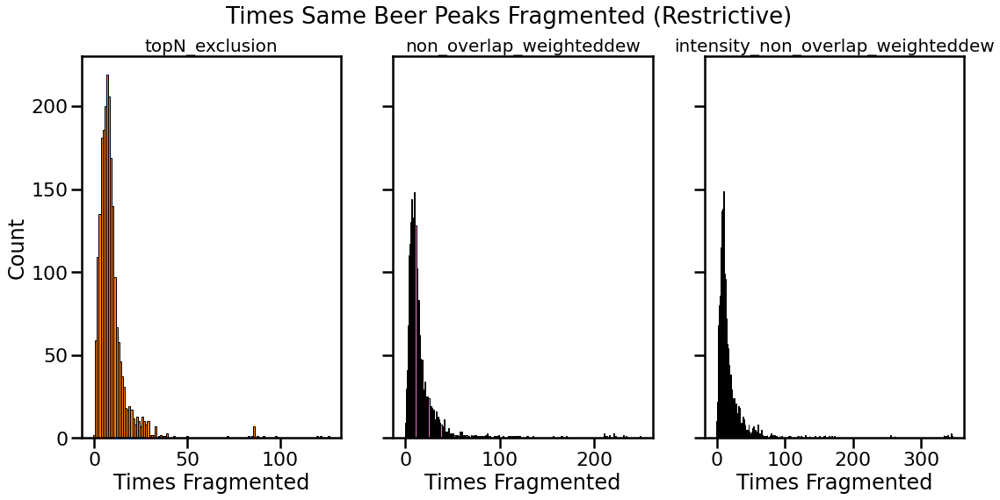

In [18]:
cases = ["topN_exclusion", "non_overlap_weighteddew", "intensity_non_overlap_weighteddew"]

evals = [same_evals[case_name] for case_name in ["topN_exclusion", "non_overlap", "intensity_non_overlap"]]
colours = [get_style(case_name)[0] for case_name in cases]

fig, axes = mpl_fragmentation_counts(
    evals,
    min_intensity=0.0, 
    key="times_fragmented_summary", 
    fcs=colours
)

kwargs = {
    **fig_kwargs,
    "axis_kwargs" : {
        **fig_kwargs["axis_kwargs"],
        "legend_kwargs" : None
    },
    "suptitle" : f"Times Same Beer Peaks Fragmented ({template_name})",
    "suptitle_size" : 26
}
mpl_set_figure_style(fig, **kwargs)

for case_name, ax in zip(cases, axes):
    mpl_set_axis_style(ax, title=case_name, titlesize=20)

# 2. Repeated Different Beers

In [19]:
#data_dir = f"/Users/{user}/University of Glasgow/Vinny Davies - CLDS Metabolomics Project/Experimental_Results/20220719_multi_samples_main"
data_dir = os.path.join("C:\\", "Users", "mcbrider5002", "Desktop", "Workspace", "phd", "data", "CLMS", "20220719_multi_samples_main")
out_dir = "real_repeated_different_beer"

bio_repeat = 6
tech_repeat = 4
repeat = bio_repeat * tech_repeat

fullscan_names = [f"fullscan_beer{i}_0.mzML" for i in range(1, bio_repeat+1)]
fullscan_files = {
    2 : [os.path.join(data_dir, "results_2", fs) for fs in fullscan_names],
    4 : [os.path.join(data_dir, "results_4", fs) for fs in fullscan_names]
}
print(fullscan_files)

rep_diff_case_names = [
    ("topN", 4),
    ("topN_exclusion", 2),
    ("hard_roi_exclusion", 4),
    ("intensity_roi_exclusion", 4),
    ("non_overlap", 2),
    ("intensity_non_overlap", 2)
]

line_colours, line_markers = get_line_styles([name for name, _ in rep_diff_case_names])

{2: ['C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_2\\fullscan_beer1_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_2\\fullscan_beer2_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_2\\fullscan_beer3_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_2\\fullscan_beer4_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_2\\fullscan_beer5_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_2\\fullscan_beer6_0.mzML'], 4: ['C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_4\\fullscan_beer1_0.mzML', 'C:\\Users\\mcbrider5002\\Desktop\\Workspace\\phd\\data\\CLMS\\20220719_multi_samples_main\\results_4

In [20]:
aligned_files = {}
for key in [2, 4]:
    peak_picking_outdir = out_dir
    to_align = fullscan_files[key]
    aligned_name = f"multibeers_{bio_repeat}_{tech_repeat}" + template_suffix

    aligned_files[key] = pick_aligned_peaks(
        to_align,
        peak_picking_outdir,
        aligned_name,
        mzmine_template,
        mzmine_path,
        force=False
    )

6512 aligned boxes contained in file
6512 aligned boxes contained in file


In [21]:
if(bio_repeat != 6 and tech_repeat > 1):
    raise NotImplementedError("Files not ordered as they were output")

mzml_files = {
    case_name : [
        (
            fullscan_files[key][j], 
            os.path.join(data_dir, f"results_{key}", f"{case_name}_beer{j+1}_{i}.mzML")
        ) 
        for i in range(tech_repeat)
        for j in range(bio_repeat)
    ]
    for case_name, key in rep_diff_case_names
}

files = mzml_files[rep_diff_case_names[-1][0]]
for fs, mzml in files:
    print(f"FULLSCAN: {fs}")
    print(f"FRAGMENTATION: {mzml}")
    print()

FULLSCAN: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer1_0.mzML
FRAGMENTATION: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_0.mzML

FULLSCAN: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer2_0.mzML
FRAGMENTATION: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_0.mzML

FULLSCAN: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer3_0.mzML
FRAGMENTATION: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_0.mzML

FULLSCAN: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer4_0.mzML
FRAGMENTATION: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\202207

In [22]:
rep_diff_evals = {}
for case_name, key in rep_diff_case_names:
    mzmls = mzml_files[case_name]
    rep_diff_evals[case_name] = evaluate_real(aligned_files[key], mzmls, isolation_width=0.7)
    print(case_name)
    print(rep_diff_evals[case_name].summarise(min_intensity=5000.0))
    print()

2023-05-10 12:19:03.713 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6762 scans
2023-05-10 12:19:10.043 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6801 scans
2023-05-10 12:19:16.906 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6764 scans
2023-05-10 12:19:23.265 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6805 scans
2023-05-10 12:19:29.824 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6797 scans
2023-05-10 12:19:36.081 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6712 scans
2023-05-10 12:19:42.645 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6755 scans
2023-05-10 12:19:48.847 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6795 scans
2023-05-10 12:19:55.545 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6759 scans
2023-05-10 12:20:02.060 | DEBUG    | mass_spec_utils.da

topN


2023-05-10 12:21:40.876 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6762 scans
2023-05-10 12:21:43.221 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6801 scans
2023-05-10 12:21:46.034 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6764 scans
2023-05-10 12:21:48.839 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6805 scans
2023-05-10 12:21:51.165 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6797 scans
2023-05-10 12:21:53.978 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6712 scans
2023-05-10 12:21:56.297 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6755 scans
2023-05-10 12:21:59.145 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6795 scans
2023-05-10 12:22:01.934 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6759 scans
2023-05-10 12:22:04.274 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [6439, 6477, 6440, 6480, 6471, 6391, 6430, 6470, 6435, 6482, 6465, 6401, 6437, 6478, 6449, 6481, 6470, 6399, 6438, 6710, 6657, 6715, 6470, 6395]
Cumulative coverage: [1243, 2731, 3135, 3644, 3916, 4268, 4292, 4371, 4394, 4432, 4455, 4503, 4528, 4572, 4583, 4600, 4626, 4655, 4661, 4701, 4733, 4763, 4778, 4797]
Cumulative coverage proportion: [0.2012303707301279, 0.44212400841832605, 0.5075279261777562, 0.5899303869192164, 0.6339647077869516, 0.6909502994981382, 0.6948356807511737, 0.707625060709082, 0.7113485510765744, 0.7175004047272139, 0.7212238950947062, 0.7289946576007771, 0.7330419297393557, 0.740165128703254, 0.7419459284442286, 0.7446980734984621, 0.7489072365225837, 0.753602072203335, 0.7545734175165938, 0.7610490529383196, 0.7662295612757002, 0.7710862878419945, 0.7735146511251416, 0.7765905779504614]
Cumulative intensity proportion: [0.07928432504250937, 0.19283017781164652, 0.22222217492913035, 0.28331944881343535, 0.31972864690532055, 0.35867629049

2023-05-10 12:22:45.111 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6687 scans
2023-05-10 12:22:52.048 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5795 scans
2023-05-10 12:23:04.639 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4789 scans
2023-05-10 12:23:22.184 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4655 scans
2023-05-10 12:23:39.704 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4260 scans
2023-05-10 12:24:00.679 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4000 scans
2023-05-10 12:24:21.961 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4191 scans
2023-05-10 12:24:41.627 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4380 scans
2023-05-10 12:25:01.841 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4047 scans
2023-05-10 12:25:23.017 | DEBUG    | mass_spec_utils.da

topN_exclusion


2023-05-10 12:30:58.456 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6687 scans
2023-05-10 12:31:01.586 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5795 scans
2023-05-10 12:31:03.721 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4789 scans
2023-05-10 12:31:05.828 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4655 scans
2023-05-10 12:31:08.921 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4260 scans
2023-05-10 12:31:10.918 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4000 scans
2023-05-10 12:31:12.947 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4191 scans
2023-05-10 12:31:15.077 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4380 scans
2023-05-10 12:31:18.531 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4047 scans
2023-05-10 12:31:20.569 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [6350, 5038, 3568, 3374, 2804, 2504, 2744, 2993, 2508, 2609, 2318, 1856, 2307, 2702, 2272, 2488, 2160, 1245, 2169, 2553, 2144, 2326, 1960, 960]
Cumulative coverage: [1259, 2877, 3598, 3970, 4195, 4546, 4639, 4862, 4958, 5012, 5054, 5121, 5147, 5233, 5248, 5281, 5307, 5343, 5357, 5388, 5401, 5418, 5427, 5441]
Cumulative coverage proportion: [0.20118248641738576, 0.4597315436241611, 0.5749440715883669, 0.634387983381272, 0.670341962288271, 0.7264301693831895, 0.7412911473314158, 0.776925535314797, 0.79226589964845, 0.8008948545861297, 0.8076062639821029, 0.8183125599232982, 0.8224672419303292, 0.8362096516458932, 0.8386065835730265, 0.8438798338127197, 0.8480345158197508, 0.8537871524448706, 0.856024288910195, 0.8609779482262704, 0.8630552892297859, 0.8657718120805369, 0.8672099712368169, 0.8694471077021413]
Cumulative intensity proportion: [0.0824611057247622, 0.22658305041532828, 0.2917429539629763, 0.33332963831001866, 0.3585728885052464, 0.3896810978542585, 

2023-05-10 12:31:57.511 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6244 scans
2023-05-10 12:32:04.004 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6261 scans
2023-05-10 12:32:10.780 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5453 scans
2023-05-10 12:32:18.782 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5361 scans
2023-05-10 12:32:28.238 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4829 scans
2023-05-10 12:32:38.465 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4325 scans
2023-05-10 12:32:49.295 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4504 scans
2023-05-10 12:32:59.531 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4353 scans
2023-05-10 12:33:11.590 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3788 scans
2023-05-10 12:33:24.308 | DEBUG    | mass_spec_utils.da

hard_roi_exclusion


2023-05-10 12:36:33.557 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6244 scans
2023-05-10 12:36:36.612 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6261 scans
2023-05-10 12:36:38.587 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5453 scans
2023-05-10 12:36:40.544 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5361 scans
2023-05-10 12:36:43.307 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4829 scans
2023-05-10 12:36:45.046 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4325 scans
2023-05-10 12:36:46.830 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4504 scans
2023-05-10 12:36:48.601 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4353 scans
2023-05-10 12:36:51.329 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3788 scans
2023-05-10 12:36:53.018 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [5945, 5960, 4964, 4814, 4134, 3563, 3774, 3567, 2874, 3199, 2822, 2583, 3124, 5750, 2509, 3061, 2929, 2537, 2683, 3125, 2420, 2863, 2570, 2398]
Cumulative coverage: [1167, 2712, 3199, 3748, 4059, 4479, 4620, 4835, 4898, 4962, 5032, 5127, 5159, 5279, 5306, 5324, 5357, 5389, 5408, 5478, 5488, 5502, 5524, 5541]
Cumulative coverage proportion: [0.18932511356262166, 0.4399740428293316, 0.5189811810512654, 0.6080467229072031, 0.6585009733939, 0.7266385463984426, 0.7495133030499675, 0.7843932511356262, 0.7946138870863076, 0.8049967553536664, 0.8163530175210902, 0.831765087605451, 0.8369565217391305, 0.8564243997404283, 0.8608046722907203, 0.863724853990915, 0.8690785204412719, 0.8742699545749514, 0.8773523685918235, 0.8887086307592472, 0.890330953926022, 0.8926022063595068, 0.8961713173264114, 0.8989292667099286]
Cumulative intensity proportion: [0.08042690647072788, 0.20836225514035006, 0.24622829977337057, 0.311583890051897, 0.3488133793247641, 0.3868821111966349,

2023-05-10 12:37:23.703 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6297 scans
2023-05-10 12:37:30.078 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6261 scans
2023-05-10 12:37:36.956 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6523 scans
2023-05-10 12:37:43.603 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6622 scans
2023-05-10 12:37:50.102 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5634 scans
2023-05-10 12:37:58.247 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4708 scans
2023-05-10 12:38:07.274 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4800 scans
2023-05-10 12:38:17.259 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5534 scans
2023-05-10 12:38:25.675 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4595 scans
2023-05-10 12:38:35.761 | DEBUG    | mass_spec_utils.da

intensity_roi_exclusion


2023-05-10 12:41:14.849 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6297 scans
2023-05-10 12:41:18.024 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6261 scans
2023-05-10 12:41:20.214 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6523 scans
2023-05-10 12:41:22.423 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6622 scans
2023-05-10 12:41:25.438 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5634 scans
2023-05-10 12:41:27.251 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4708 scans
2023-05-10 12:41:29.075 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4800 scans
2023-05-10 12:41:31.055 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5534 scans
2023-05-10 12:41:34.005 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4595 scans
2023-05-10 12:41:35.863 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [5995, 5960, 6202, 6295, 5166, 4056, 4158, 5054, 3916, 4203, 3670, 3537, 4083, 4436, 3503, 3704, 3317, 2913, 3161, 4113, 3183, 3432, 5979, 2540]
Cumulative coverage: [1185, 2687, 3262, 3856, 4150, 4555, 4691, 4929, 4999, 5074, 5154, 5248, 5283, 5379, 5410, 5436, 5468, 5503, 5520, 5566, 5590, 5599, 5679, 5694]
Cumulative coverage proportion: [0.19180964713499515, 0.4349303981871156, 0.528002589834898, 0.6241502104240855, 0.6717384266752995, 0.7372936225315636, 0.7593072191647783, 0.7978310132729038, 0.8091615409517643, 0.8213013920362577, 0.834250566526384, 0.8494658465522823, 0.8551311103917125, 0.8706701197798641, 0.875687924894788, 0.879896406604079, 0.8850760764001295, 0.8907413402395598, 0.8934930398187115, 0.9009388151505342, 0.904823567497572, 0.9062803496277112, 0.9192295241178375, 0.9216574943347362]
Cumulative intensity proportion: [0.07828941511797677, 0.20693787747676287, 0.26056646108658343, 0.3505472166851567, 0.37907650687263095, 0.41657350609035

2023-05-10 12:42:07.025 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6207 scans
2023-05-10 12:42:13.159 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6212 scans
2023-05-10 12:42:20.539 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6216 scans
2023-05-10 12:42:26.717 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6222 scans
2023-05-10 12:42:32.953 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6245 scans
2023-05-10 12:42:39.186 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6138 scans
2023-05-10 12:42:46.374 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6177 scans
2023-05-10 12:42:52.501 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6116 scans
2023-05-10 12:42:58.981 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6156 scans
2023-05-10 12:43:05.246 | DEBUG    | mass_spec_utils.da

non_overlap


2023-05-10 12:44:41.309 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6207 scans
2023-05-10 12:44:43.429 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6212 scans
2023-05-10 12:44:46.656 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6216 scans
2023-05-10 12:44:48.772 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6222 scans
2023-05-10 12:44:50.885 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6245 scans
2023-05-10 12:44:52.961 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6138 scans
2023-05-10 12:44:56.261 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6177 scans
2023-05-10 12:44:58.360 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6116 scans
2023-05-10 12:45:00.448 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6156 scans
2023-05-10 12:45:02.536 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [5909, 5914, 5918, 5923, 5945, 5843, 5881, 5807, 5851, 5874, 5892, 5776, 5834, 5851, 5861, 5888, 5776, 5793, 5767, 5800, 5737, 6188, 6183, 6091]
Cumulative coverage: [1203, 2792, 3562, 4021, 4311, 4739, 4901, 5130, 5238, 5308, 5369, 5459, 5492, 5587, 5626, 5652, 5679, 5733, 5747, 5789, 5801, 5854, 5919, 5960]
Cumulative coverage proportion: [0.19217252396166135, 0.4460063897763578, 0.5690095846645368, 0.642332268370607, 0.6886581469648563, 0.7570287539936102, 0.7829073482428115, 0.8194888178913738, 0.836741214057508, 0.8479233226837061, 0.857667731629393, 0.8720447284345048, 0.8773162939297124, 0.8924920127795527, 0.8987220447284345, 0.9028753993610223, 0.9071884984025559, 0.915814696485623, 0.9180511182108626, 0.9247603833865815, 0.9266773162939297, 0.9351437699680512, 0.9455271565495208, 0.952076677316294]
Cumulative intensity proportion: [0.08183567178491556, 0.22655909566995766, 0.29761266277222537, 0.3409116070298607, 0.3706173148164768, 0.405150218884343

2023-05-10 12:45:39.451 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6112 scans
2023-05-10 12:45:46.022 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6201 scans
2023-05-10 12:45:52.948 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6213 scans
2023-05-10 12:45:59.716 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6259 scans
2023-05-10 12:46:05.346 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6223 scans
2023-05-10 12:46:12.066 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6117 scans
2023-05-10 12:46:18.806 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6145 scans
2023-05-10 12:46:24.249 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6135 scans
2023-05-10 12:46:31.252 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6144 scans
2023-05-10 12:46:36.904 | DEBUG    | mass_spec_utils.da

intensity_non_overlap


2023-05-10 12:48:10.001 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6112 scans
2023-05-10 12:48:12.118 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6201 scans
2023-05-10 12:48:15.569 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6213 scans
2023-05-10 12:48:17.704 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6259 scans
2023-05-10 12:48:19.805 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6223 scans
2023-05-10 12:48:21.876 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6117 scans
2023-05-10 12:48:23.949 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6145 scans
2023-05-10 12:48:27.449 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6135 scans
2023-05-10 12:48:29.553 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6144 scans
2023-05-10 12:48:31.637 | DEBUG    | mass_spec_utils.da

Number of fragmentations: [5819, 5903, 5915, 5959, 5924, 5823, 5850, 5836, 5849, 5880, 5874, 5718, 5776, 5761, 5783, 5811, 5778, 5632, 5681, 5690, 5673, 5728, 5709, 5534]
Cumulative coverage: [1176, 2773, 3540, 4015, 4346, 4796, 4940, 5190, 5294, 5357, 5425, 5529, 5571, 5643, 5682, 5711, 5739, 5775, 5802, 5851, 5870, 5886, 5909, 5930]
Cumulative coverage proportion: [0.1900759657346048, 0.44819783416841763, 0.5721674478745757, 0.6489413285922094, 0.702440601260708, 0.7751737514142557, 0.798448359463391, 0.8388556651042508, 0.8556651042508485, 0.8658477452723452, 0.8768385324066591, 0.8936479715532568, 0.9004363989009213, 0.912073702925489, 0.918377242605463, 0.9230644900598028, 0.9275901082915791, 0.9334087603038629, 0.9377727493130759, 0.9456925812186844, 0.9487635364473896, 0.9513496040084047, 0.9550670761273639, 0.958461289801196]
Cumulative intensity proportion: [0.08763365447032608, 0.23820727192376143, 0.32270355195715555, 0.390853813920717, 0.4352958932619628, 0.4820300928421314

In [23]:
names = [
    "topN", 
    "topN_exclusion", 
    "hard_roi_exclusion_weighteddew", 
    "intensity_roi_exclusion_weighteddew",
    "non_overlap_weighteddew",
    "intensity_non_overlap_weighteddew"
]

legend_elements = [
    Line2D([0], [0], marker="o", color="black", label="Standard DEW", markerfacecolor="black", markersize=markersize),
    Line2D([0], [0], marker="^", color="black", label="WeightedDEW", markerfacecolor="black", markersize=markersize),
    Line2D([0], [0], color="white", label="", markerfacecolor="black", markersize=markersize),
]

for name, _ in rep_diff_case_names:
    legend_elements.append(
        Line2D([0], [0], marker="s", color="white", label=name_map[name], markerfacecolor=colour_map[name], markersize=14)
    )

kwargs = {
    **fig_kwargs,
    "axis_kwargs" : {
        **fig_kwargs["axis_kwargs"],
        "legend_kwargs" : {
            **fig_kwargs["axis_kwargs"]["legend_kwargs"], 
            "loc" : "lower right",
            "handles" : legend_elements
        },
    },
    "suptitle" : "6 Different Beers with 4 Replicates", "suptitle_size" : 26
}

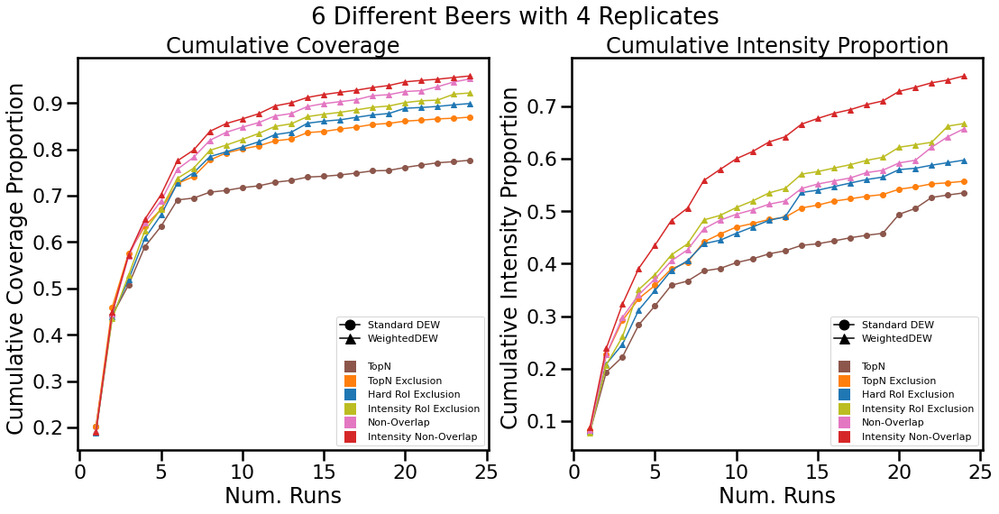

In [24]:
fig, axes = mpl_results_plot(
    names,
    [rep_diff_evals[case_name] for case_name, _ in rep_diff_case_names],
    min_intensity=5000.0,
    colours=[colour_map[case_name] for case_name, _ in rep_diff_case_names],
    markers=["o", "o", "^", "^", "^", "^"]
)

mpl_set_figure_style(fig, **kwargs)

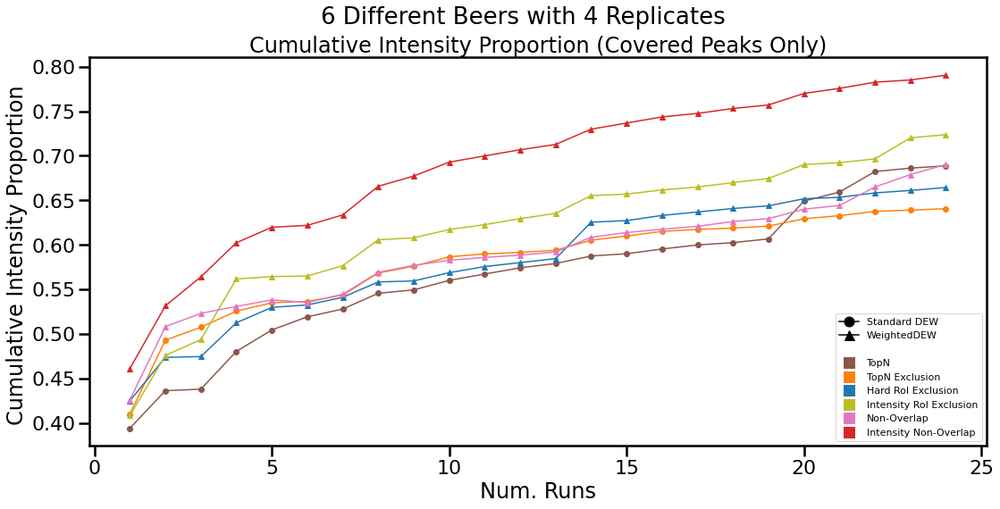

In [25]:
fig, axes = mpl_results_plot(
    names,
    [rep_diff_evals[case_name] for case_name, _ in rep_diff_case_names],
    min_intensity=5000.0,
    colours=[colour_map[case_name] for case_name, _ in rep_diff_case_names],
    markers=["o", "o", "^", "^", "^", "^"],
    keys=["cumulative_covered_intensities_proportion"]
)

new_kwargs = {
    **kwargs,
    "axis_kwargs" : {
        **kwargs["axis_kwargs"],
        "legend_kwargs" : {**kwargs["axis_kwargs"]["legend_kwargs"], "loc" : "lower right"},
    },
    "suptitle" : "6 Different Beers with 4 Replicates", "suptitle_size" : 26
}
mpl_set_figure_style(fig, **new_kwargs)

In [26]:
plotly_results_plot(
    names,
    [rep_diff_evals[case_name] for case_name, _ in rep_diff_case_names],
    min_intensity=5000.0,
    suptitle=f"{bio_repeat} Different Beers with {tech_repeat} Replicates"
)

2023-05-10 12:49:07.771 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6687 scans
2023-05-10 12:49:10.007 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5795 scans
2023-05-10 12:49:13.639 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4789 scans
2023-05-10 12:49:15.769 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4655 scans
2023-05-10 12:49:17.840 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4260 scans
2023-05-10 12:49:19.894 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4000 scans
2023-05-10 12:49:21.968 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4191 scans
2023-05-10 12:49:24.078 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4380 scans
2023-05-10 12:49:26.165 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4047 scans
2023-05-10 12:49:28.239 | DEBUG    | mass_spec_utils.da

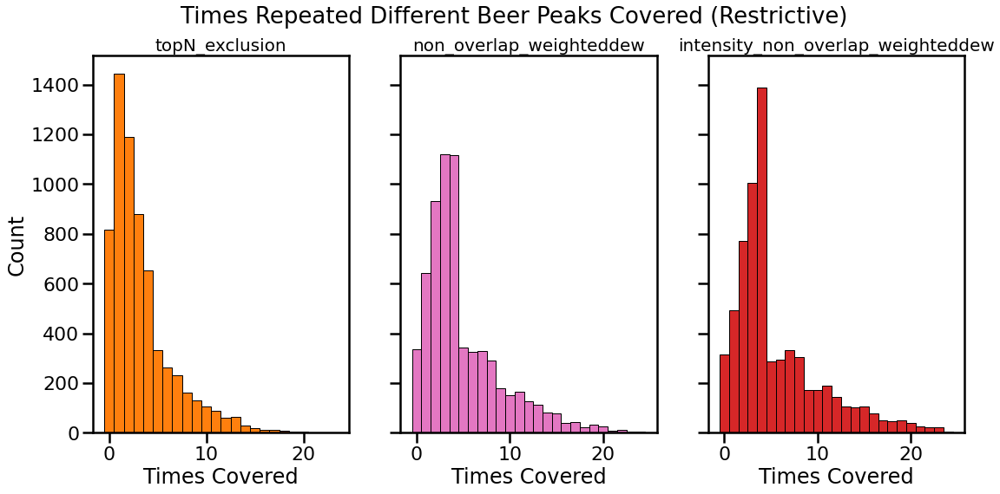

In [27]:
cases = ["topN_exclusion", "non_overlap_weighteddew", "intensity_non_overlap_weighteddew"]

evals = [rep_diff_evals[case_name] for case_name in ["topN_exclusion", "non_overlap", "intensity_non_overlap"]]
colours = [get_style(case_name)[0] for case_name in cases]

fig, axes = mpl_fragmentation_counts(
    evals,
    min_intensity=0.0, 
    key="times_covered_summary", 
    fcs=colours
)

kwargs = {
    **fig_kwargs,
    "axis_kwargs" : {
        **fig_kwargs["axis_kwargs"],
        "legend_kwargs" : None
    },
    "suptitle" : f"Times Repeated Different Beer Peaks Covered ({template_name})",
    "suptitle_size" : 26
}
mpl_set_figure_style(fig, **kwargs)

for case_name, ax in zip(cases, axes):
    mpl_set_axis_style(ax, title=case_name, titlesize=20)

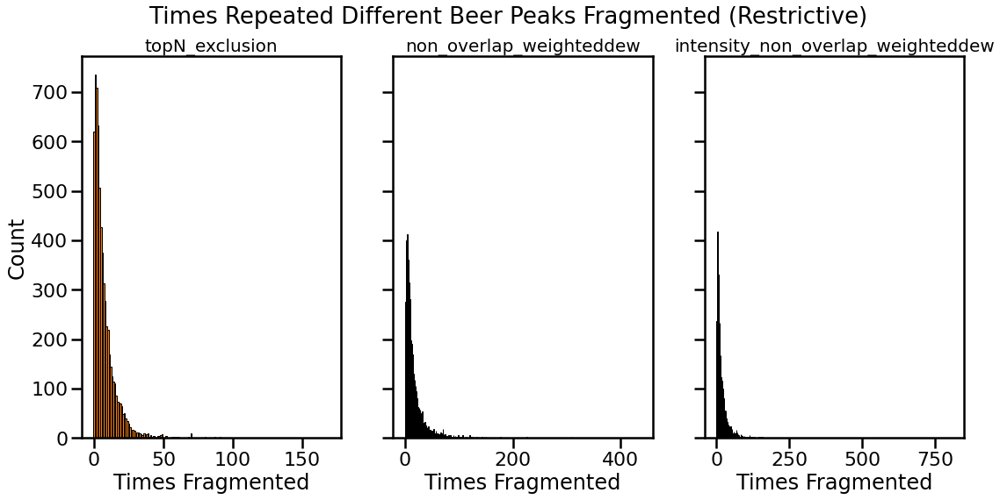

In [28]:
cases = ["topN_exclusion", "non_overlap_weighteddew", "intensity_non_overlap_weighteddew"]

evals = [rep_diff_evals[case_name] for case_name in ["topN_exclusion", "non_overlap", "intensity_non_overlap"]]
colours = [get_style(case_name)[0] for case_name in cases]

fig, axes = mpl_fragmentation_counts(
    evals,
    min_intensity=0.0, 
    key="times_fragmented_summary", 
    fcs=colours
)

kwargs = {
    **fig_kwargs,
    "axis_kwargs" : {
        **fig_kwargs["axis_kwargs"],
        "legend_kwargs" : None
    },
    "suptitle" : f"Times Repeated Different Beer Peaks Fragmented ({template_name})",
    "suptitle_size" : 26
}
mpl_set_figure_style(fig, **kwargs)

for case_name, ax in zip(cases, axes):
    mpl_set_axis_style(ax, title=case_name, titlesize=20)

# Other Plots

In [29]:
frag_plots = ["topN_exclusion", "intensity_non_overlap"]

2023-05-10 12:52:03.014 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6687 scans
2023-05-10 12:52:07.189 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4191 scans
2023-05-10 12:52:14.554 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3893 scans
2023-05-10 12:52:22.189 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3792 scans
2023-05-10 12:52:29.873 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6112 scans
2023-05-10 12:52:34.014 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6145 scans
2023-05-10 12:52:38.025 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6067 scans
2023-05-10 12:52:40.644 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5968 scans


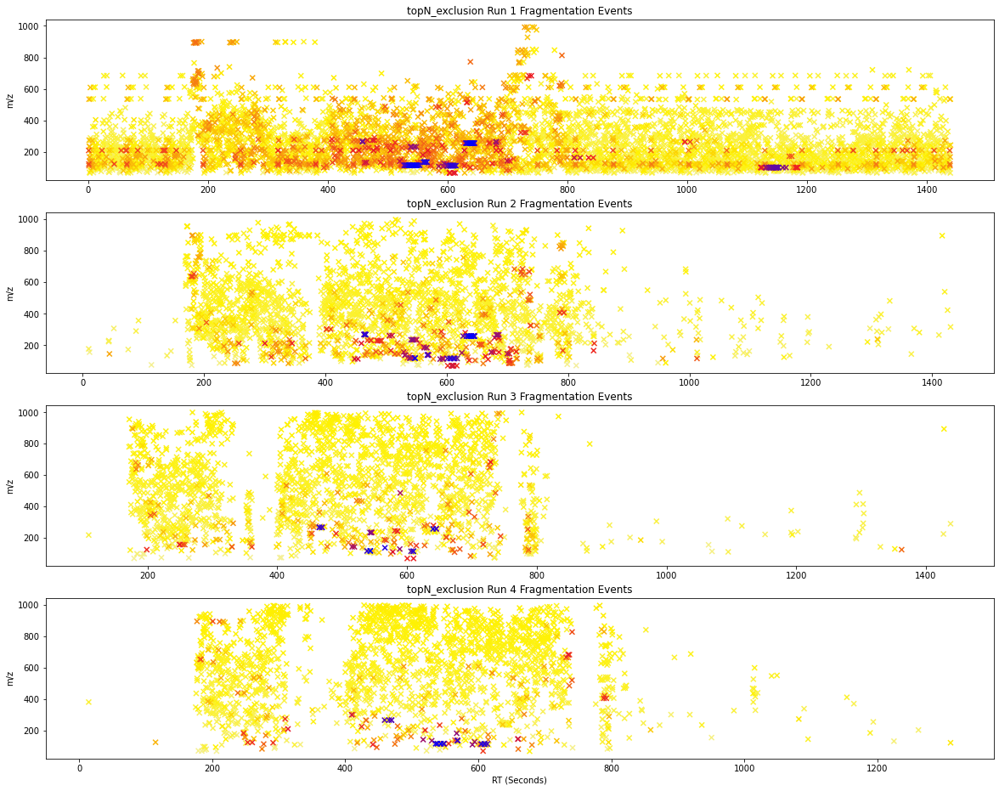

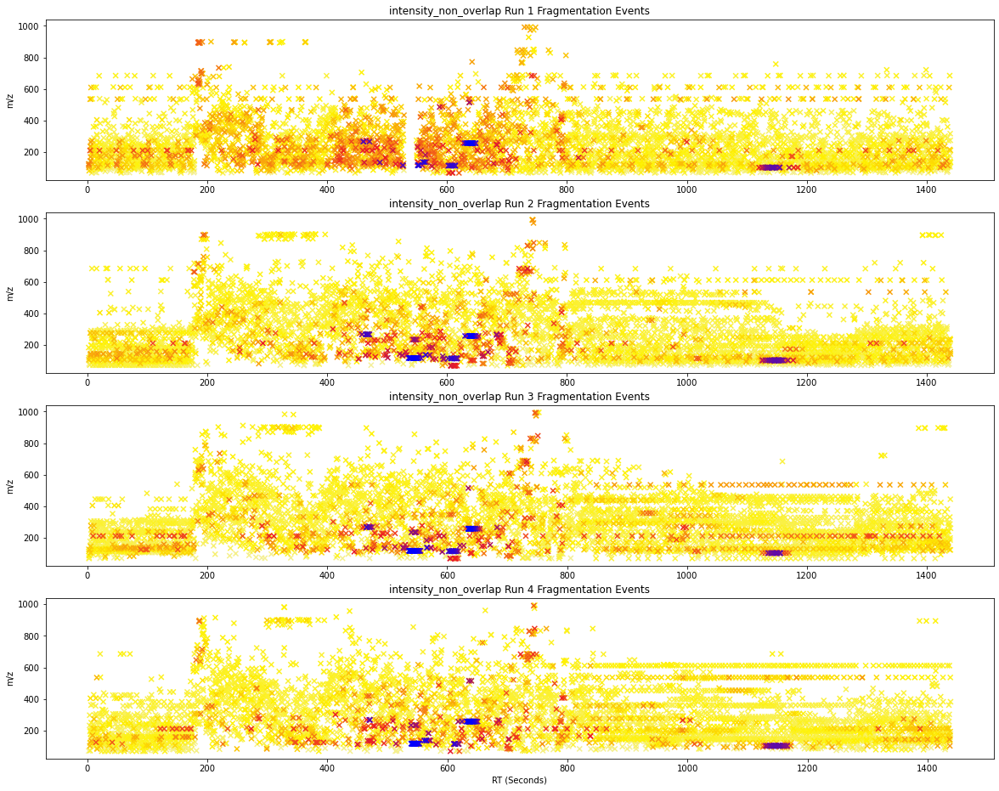

In [30]:
for case_name in frag_plots:
    mzmls = [mzml for _, mzml in mzml_files[case_name]][::6]
    mpl_fragmentation_events(case_name, mzmls, colour_minm=math.log(500.0))
    del mzmls

In [31]:
for case_name in frag_plots:
    mzmls = [mzml for _, mzml in mzml_files[case_name]][::6]
    plotly_fragmentation_events(case_name, mzmls, colour_minm=math.log(500.0))
    del mzmls

2023-05-10 12:52:46.069 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6687 scans
2023-05-10 12:52:50.167 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4191 scans
2023-05-10 12:52:57.541 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3893 scans
2023-05-10 12:53:05.227 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3792 scans


2023-05-10 12:53:13.241 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6112 scans
2023-05-10 12:53:15.929 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6145 scans
2023-05-10 12:53:20.097 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6067 scans
2023-05-10 12:53:22.761 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5968 scans


2023-05-10 12:53:27.484 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6687 scans
2023-05-10 12:53:29.715 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5795 scans
2023-05-10 12:53:31.848 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4789 scans
2023-05-10 12:53:33.979 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4655 scans
2023-05-10 12:53:36.065 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4260 scans
2023-05-10 12:53:40.127 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4000 scans
2023-05-10 12:53:42.200 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4191 scans
2023-05-10 12:53:44.350 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4380 scans
2023-05-10 12:53:46.493 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4047 scans
2023-05-10 12:53:48.641 | DEBUG    | mass_spec_utils.da

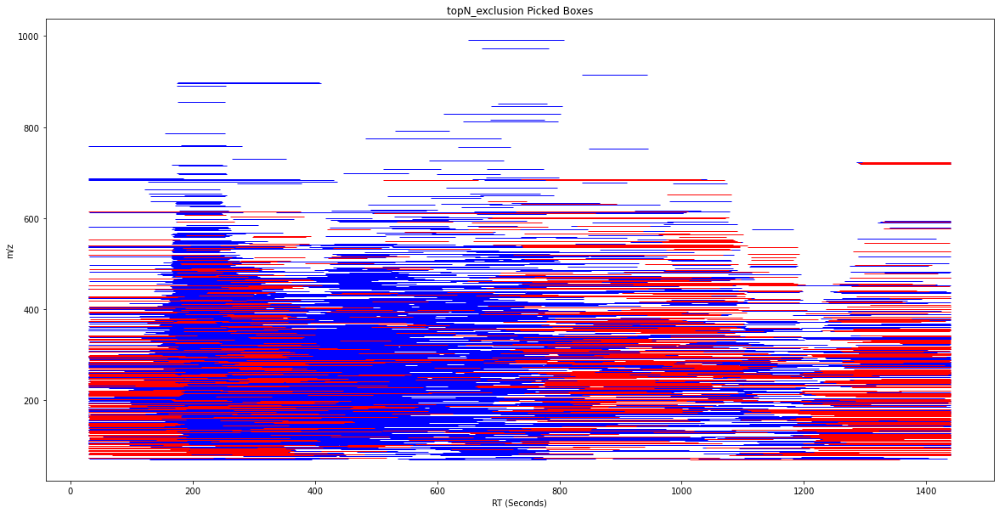

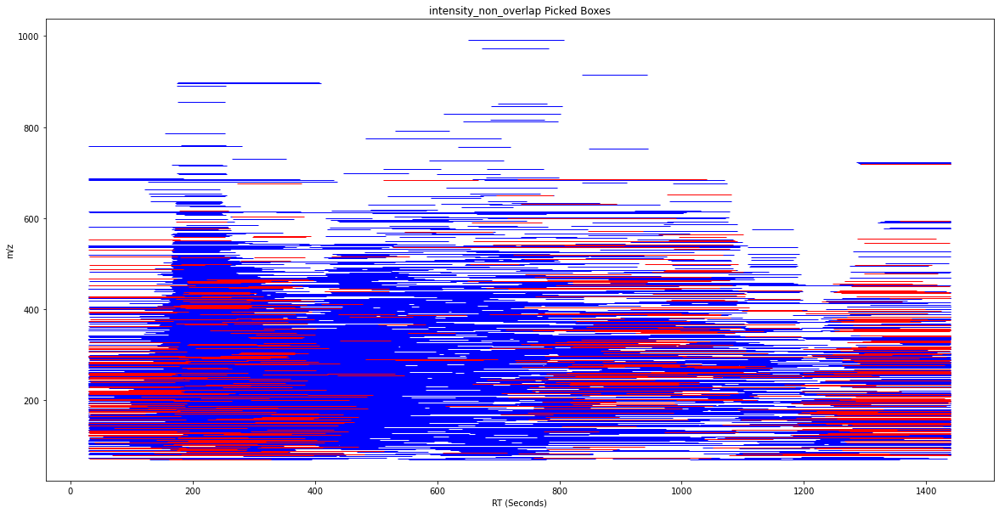

In [32]:
for case_name in frag_plots:
    fig, ax = mpl_fragmented_boxes(case_name, rep_diff_evals[case_name], min_intensity=5000.0)
    mpl_set_figure_style(fig, figure_sizes=(20, 10))

Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220706_DDAvsDIA\results_1\fullscan_beer1_0.mzML


2023-05-10 12:55:39.703 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2489 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220706_DDAvsDIA\results_1\fullscan_beer2_0.mzML


2023-05-10 12:55:42.481 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2575 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220706_DDAvsDIA\results_1\fullscan_beer3_0.mzML


2023-05-10 12:55:45.124 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2552 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220706_DDAvsDIA\results_1\fullscan_beer4_0.mzML


2023-05-10 12:55:47.767 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2575 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220706_DDAvsDIA\results_1\fullscan_beer5_0.mzML


2023-05-10 12:55:50.349 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2563 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220706_DDAvsDIA\results_1\fullscan_beer6_0.mzML


2023-05-10 12:55:52.955 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2469 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer1_0.mzML


2023-05-10 12:55:55.488 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2706 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer2_0.mzML


2023-05-10 12:55:58.190 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2775 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer3_0.mzML


2023-05-10 12:56:02.832 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2628 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer4_0.mzML


2023-05-10 12:56:05.427 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2808 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer5_0.mzML


2023-05-10 12:56:07.975 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2741 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\fullscan_beer6_0.mzML


2023-05-10 12:56:10.553 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2586 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer1_0.mzML


2023-05-10 12:56:13.489 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2560 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer2_0.mzML


2023-05-10 12:56:16.191 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2659 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer3_0.mzML


2023-05-10 12:56:18.743 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2611 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer4_0.mzML


2023-05-10 12:56:21.330 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2643 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer5_0.mzML


2023-05-10 12:56:23.828 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2615 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_3\fullscan_beer6_0.mzML


2023-05-10 12:56:26.332 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2544 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\fullscan_beer1_0.mzML


2023-05-10 12:56:29.279 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2605 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\fullscan_beer2_0.mzML


2023-05-10 12:56:31.949 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2685 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\fullscan_beer3_0.mzML


2023-05-10 12:56:34.494 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2629 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\fullscan_beer4_0.mzML


2023-05-10 12:56:37.064 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2676 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\fullscan_beer5_0.mzML


2023-05-10 12:56:39.551 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2658 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\fullscan_beer6_0.mzML


2023-05-10 12:56:42.073 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2588 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer1_0.mzML


2023-05-10 12:56:47.298 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6762 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer2_0.mzML


2023-05-10 12:56:49.731 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6801 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer3_0.mzML


2023-05-10 12:56:52.117 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6764 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer4_0.mzML


2023-05-10 12:56:54.457 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6805 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer5_0.mzML


2023-05-10 12:57:25.761 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6797 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer6_0.mzML


2023-05-10 12:57:28.122 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6712 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer1_1.mzML


2023-05-10 12:57:30.471 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6755 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer2_1.mzML


2023-05-10 12:57:32.845 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6795 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer3_1.mzML


2023-05-10 12:57:35.212 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6759 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer4_1.mzML


2023-05-10 12:57:39.457 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6807 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer5_1.mzML


2023-05-10 12:57:41.832 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6789 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer6_1.mzML


2023-05-10 12:57:44.181 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6722 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer1_2.mzML


2023-05-10 12:57:46.495 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6761 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer2_2.mzML


2023-05-10 12:57:48.837 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6803 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer3_2.mzML


2023-05-10 12:57:52.699 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6772 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer4_2.mzML


2023-05-10 12:57:55.068 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6806 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer5_2.mzML


2023-05-10 12:57:57.405 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6795 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer6_2.mzML


2023-05-10 12:57:59.706 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6720 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer1_3.mzML


2023-05-10 12:58:03.677 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6761 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer2_3.mzML


2023-05-10 12:58:06.260 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 7048 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer3_3.mzML


2023-05-10 12:58:08.672 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6994 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer4_3.mzML


2023-05-10 12:58:11.071 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 7055 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer5_3.mzML


2023-05-10 12:58:13.445 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6795 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\topN_beer6_3.mzML


2023-05-10 12:58:15.788 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6716 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer1_0.mzML


2023-05-10 12:58:20.272 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6687 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer2_0.mzML


2023-05-10 12:58:22.553 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5795 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer3_0.mzML


2023-05-10 12:58:24.696 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4789 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer4_0.mzML


2023-05-10 12:58:26.849 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4655 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer5_0.mzML


2023-05-10 12:58:28.985 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4260 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer6_0.mzML


2023-05-10 12:58:31.105 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4000 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer1_1.mzML


2023-05-10 12:58:33.236 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4191 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer2_1.mzML


2023-05-10 12:58:38.268 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4380 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer3_1.mzML


2023-05-10 12:58:40.432 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4047 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer4_1.mzML


2023-05-10 12:58:42.553 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4113 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer5_1.mzML


2023-05-10 12:58:44.602 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3917 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer6_1.mzML


2023-05-10 12:58:46.651 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3558 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer1_2.mzML


2023-05-10 12:58:48.698 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3893 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer2_2.mzML


2023-05-10 12:58:50.815 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4178 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer3_2.mzML


2023-05-10 12:58:52.902 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3879 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer4_2.mzML


2023-05-10 12:58:54.967 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4027 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer5_2.mzML


2023-05-10 12:58:57.031 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3805 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer6_2.mzML


2023-05-10 12:59:00.970 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3146 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer1_3.mzML


2023-05-10 12:59:03.089 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3792 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer2_3.mzML


2023-05-10 12:59:05.278 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4071 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer3_3.mzML


2023-05-10 12:59:07.368 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3789 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer4_3.mzML


2023-05-10 12:59:09.444 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3914 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer5_3.mzML


2023-05-10 12:59:11.491 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3662 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\topN_exclusion_beer6_3.mzML


2023-05-10 12:59:13.508 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 2948 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer1_0.mzML


2023-05-10 12:59:16.160 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6244 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer2_0.mzML


2023-05-10 12:59:33.474 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6261 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer3_0.mzML


2023-05-10 12:59:35.510 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5453 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer4_0.mzML


2023-05-10 12:59:37.485 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5361 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer5_0.mzML


2023-05-10 12:59:39.332 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4829 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer6_0.mzML


2023-05-10 12:59:41.071 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4325 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer1_1.mzML


2023-05-10 12:59:42.835 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4504 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer2_1.mzML


2023-05-10 12:59:44.619 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4353 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer3_1.mzML


2023-05-10 12:59:47.802 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3788 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer4_1.mzML


2023-05-10 12:59:49.564 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4076 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer5_1.mzML


2023-05-10 12:59:51.270 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3785 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer6_1.mzML


2023-05-10 12:59:52.951 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3547 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer1_2.mzML


2023-05-10 12:59:54.696 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3986 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer2_2.mzML


2023-05-10 12:59:56.862 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6169 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer3_2.mzML


2023-05-10 12:59:58.491 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3492 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer4_2.mzML


2023-05-10 13:00:00.174 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3960 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer5_2.mzML


2023-05-10 13:00:01.845 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3866 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer6_2.mzML


2023-05-10 13:00:05.147 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3512 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer1_3.mzML


2023-05-10 13:00:06.826 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3634 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer2_3.mzML


2023-05-10 13:00:08.554 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4009 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer3_3.mzML


2023-05-10 13:00:10.139 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3438 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer4_3.mzML


2023-05-10 13:00:11.861 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3816 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer5_3.mzML


2023-05-10 13:00:13.523 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3597 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\hard_roi_exclusion_beer6_3.mzML


2023-05-10 13:00:15.146 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3406 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer1_0.mzML


2023-05-10 13:00:17.855 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6297 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer2_0.mzML


2023-05-10 13:00:25.492 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6261 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer3_0.mzML


2023-05-10 13:00:27.778 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6523 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer4_0.mzML


2023-05-10 13:00:30.040 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6622 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer5_0.mzML


2023-05-10 13:00:32.063 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5634 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer6_0.mzML


2023-05-10 13:00:33.870 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4708 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer1_1.mzML


2023-05-10 13:00:35.719 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4800 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer2_1.mzML


2023-05-10 13:00:39.261 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5534 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer3_1.mzML


2023-05-10 13:00:41.099 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4595 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer4_1.mzML


2023-05-10 13:00:43.035 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4888 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer5_1.mzML


2023-05-10 13:00:44.893 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4445 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer6_1.mzML


2023-05-10 13:00:46.677 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4291 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer1_2.mzML


2023-05-10 13:00:48.519 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4738 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer2_2.mzML


2023-05-10 13:00:50.452 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5039 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer3_2.mzML


2023-05-10 13:00:53.824 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4273 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer4_2.mzML


2023-05-10 13:00:55.643 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4461 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer5_2.mzML


2023-05-10 13:00:57.394 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4162 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer6_2.mzML


2023-05-10 13:00:59.072 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3794 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer1_3.mzML


2023-05-10 13:01:00.733 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3985 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer2_3.mzML


2023-05-10 13:01:02.585 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4776 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer3_3.mzML


2023-05-10 13:01:04.266 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4011 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer4_3.mzML


2023-05-10 13:01:06.000 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4232 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer5_3.mzML


2023-05-10 13:01:09.890 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6366 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_4\intensity_roi_exclusion_beer6_3.mzML


2023-05-10 13:01:11.526 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 3472 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer1_0.mzML


2023-05-10 13:01:14.142 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6207 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer2_0.mzML


2023-05-10 13:01:16.339 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6212 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer3_0.mzML


2023-05-10 13:01:18.520 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6216 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer4_0.mzML


2023-05-10 13:01:20.668 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6222 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer5_0.mzML


2023-05-10 13:01:27.438 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6245 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer6_0.mzML


2023-05-10 13:01:29.642 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6138 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer1_1.mzML


2023-05-10 13:01:31.821 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6177 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer2_1.mzML


2023-05-10 13:01:34.040 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6116 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer3_1.mzML


2023-05-10 13:01:36.211 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6156 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer4_1.mzML


2023-05-10 13:01:40.057 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6175 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer5_1.mzML


2023-05-10 13:01:42.281 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6190 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer6_1.mzML


2023-05-10 13:01:44.449 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6079 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer1_2.mzML


2023-05-10 13:01:46.676 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6133 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer2_2.mzML


2023-05-10 13:01:48.845 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6146 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer3_2.mzML


2023-05-10 13:01:51.029 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6158 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer4_2.mzML


2023-05-10 13:01:55.004 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6187 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer5_2.mzML


2023-05-10 13:01:57.229 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6098 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer6_2.mzML


2023-05-10 13:01:59.467 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6086 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer1_3.mzML


2023-05-10 13:02:01.628 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6074 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer2_3.mzML


2023-05-10 13:02:03.786 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6100 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer3_3.mzML


2023-05-10 13:02:05.947 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6043 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer4_3.mzML


2023-05-10 13:02:10.067 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6500 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer5_3.mzML


2023-05-10 13:02:12.365 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6495 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\non_overlap_beer6_3.mzML


2023-05-10 13:02:14.652 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6401 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_0.mzML


2023-05-10 13:02:17.425 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6112 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_0.mzML


2023-05-10 13:02:19.609 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6201 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_0.mzML


2023-05-10 13:02:24.584 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6213 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer4_0.mzML


2023-05-10 13:02:26.824 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6259 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer5_0.mzML


2023-05-10 13:02:29.014 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6223 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer6_0.mzML


2023-05-10 13:02:31.136 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6117 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_1.mzML


2023-05-10 13:02:33.238 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6145 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_1.mzML


2023-05-10 13:02:36.936 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6135 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_1.mzML


2023-05-10 13:02:39.089 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6144 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer4_1.mzML


2023-05-10 13:02:41.241 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6177 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer5_1.mzML


2023-05-10 13:02:43.392 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6170 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer6_1.mzML


2023-05-10 13:02:45.468 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6011 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_2.mzML


2023-05-10 13:02:47.587 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6067 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_2.mzML


2023-05-10 13:02:51.377 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6052 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_2.mzML


2023-05-10 13:02:53.501 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6075 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer4_2.mzML


2023-05-10 13:02:55.670 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6104 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer5_2.mzML


2023-05-10 13:02:57.784 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6070 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer6_2.mzML


2023-05-10 13:02:59.835 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5916 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_3.mzML


2023-05-10 13:03:01.899 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5968 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_3.mzML


2023-05-10 13:03:05.734 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5977 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_3.mzML


2023-05-10 13:03:07.826 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5959 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer4_3.mzML


2023-05-10 13:03:09.952 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6017 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer5_3.mzML


2023-05-10 13:03:12.035 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5999 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer6_3.mzML


2023-05-10 13:03:14.029 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5813 scans


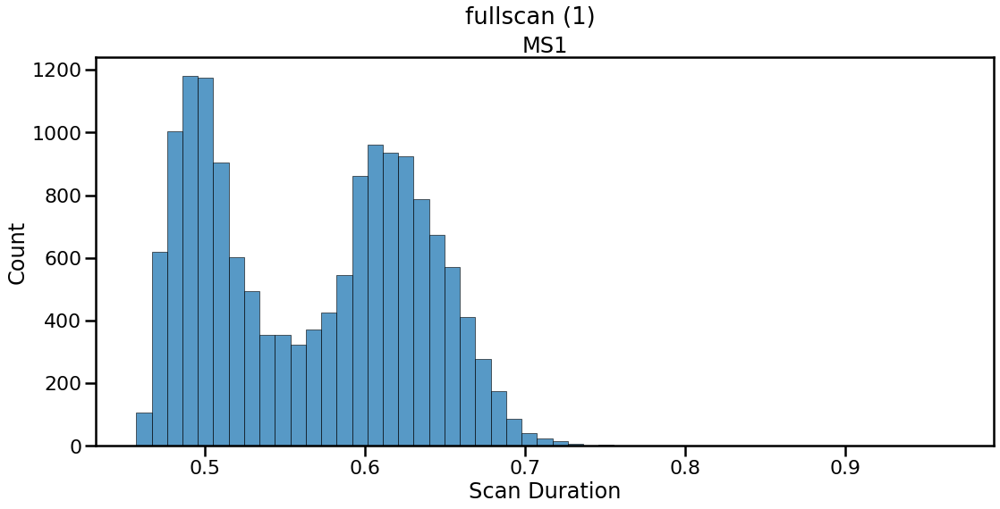

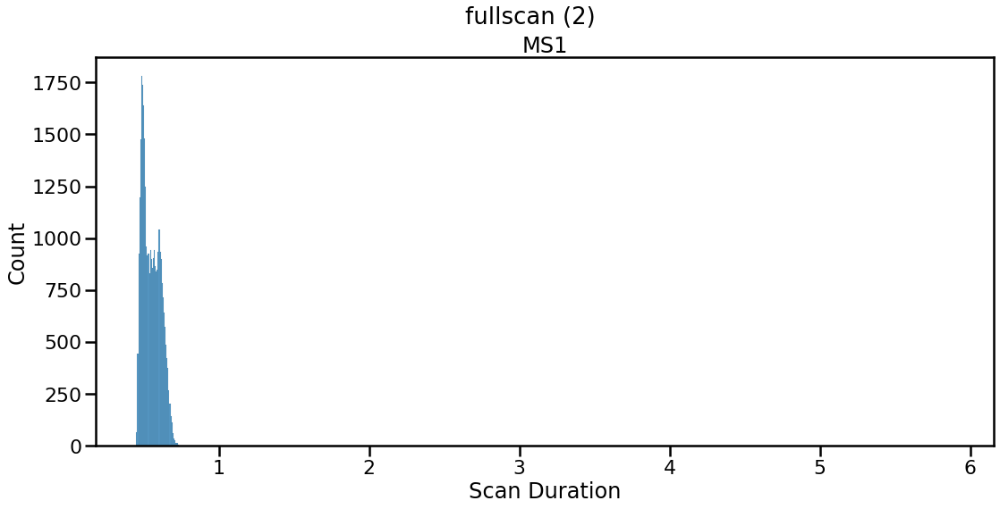

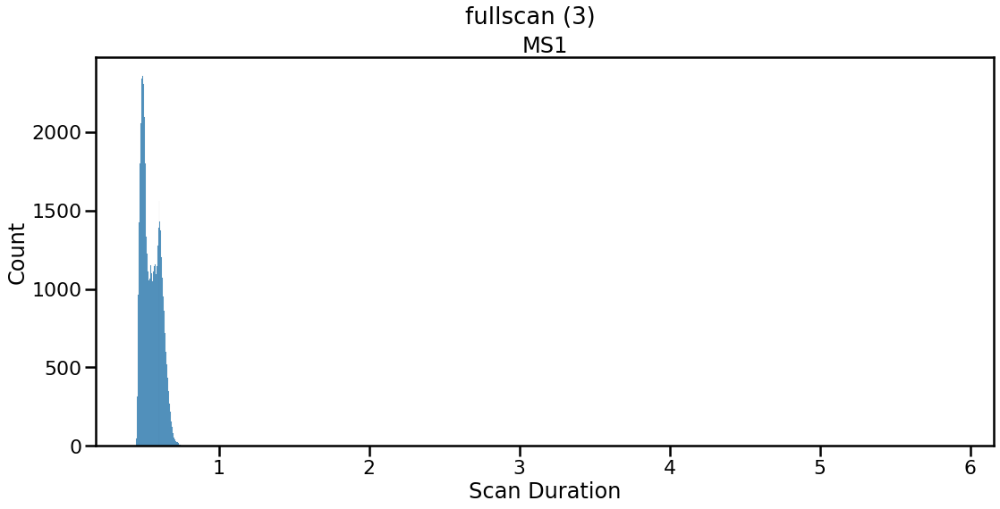

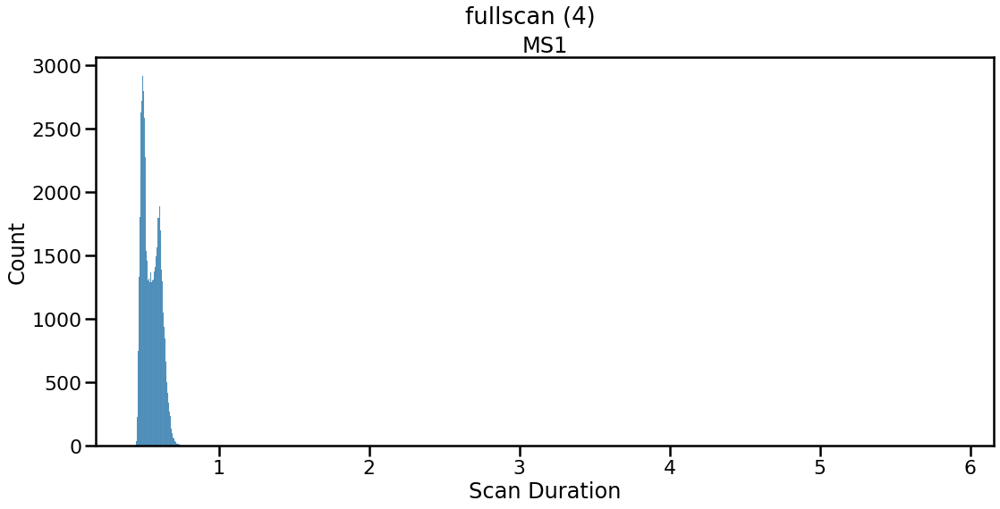

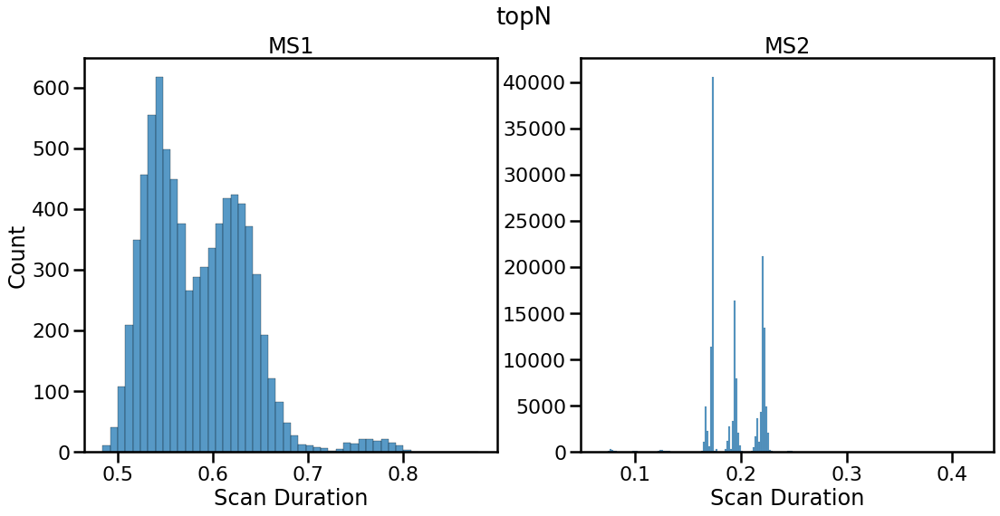

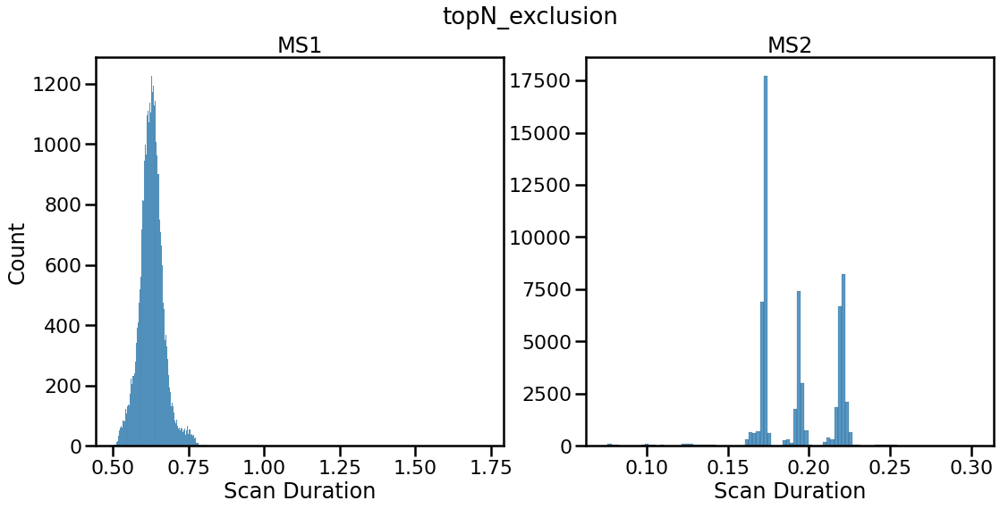

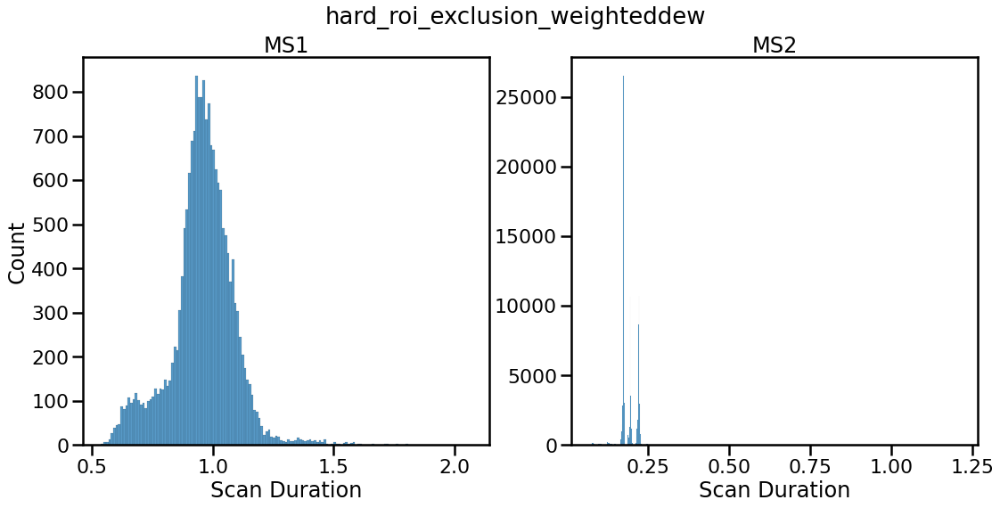

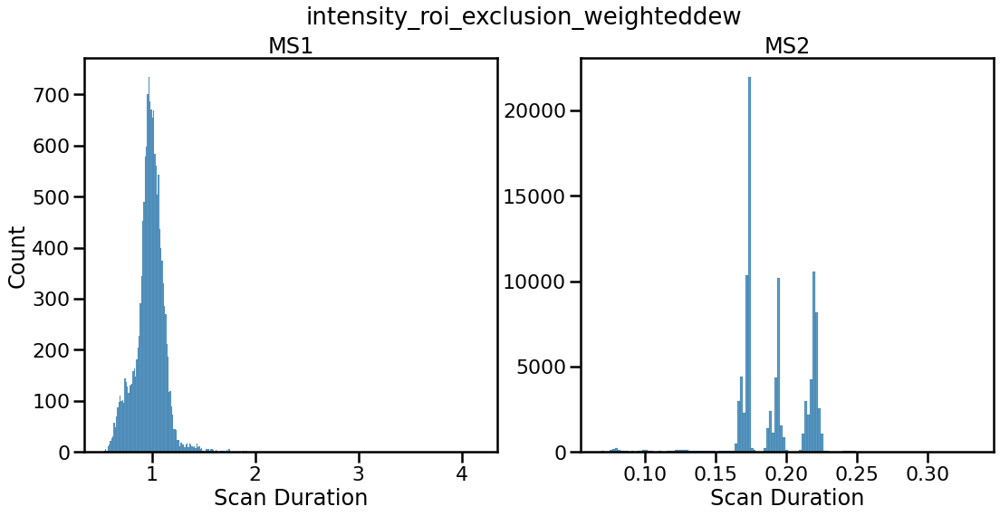

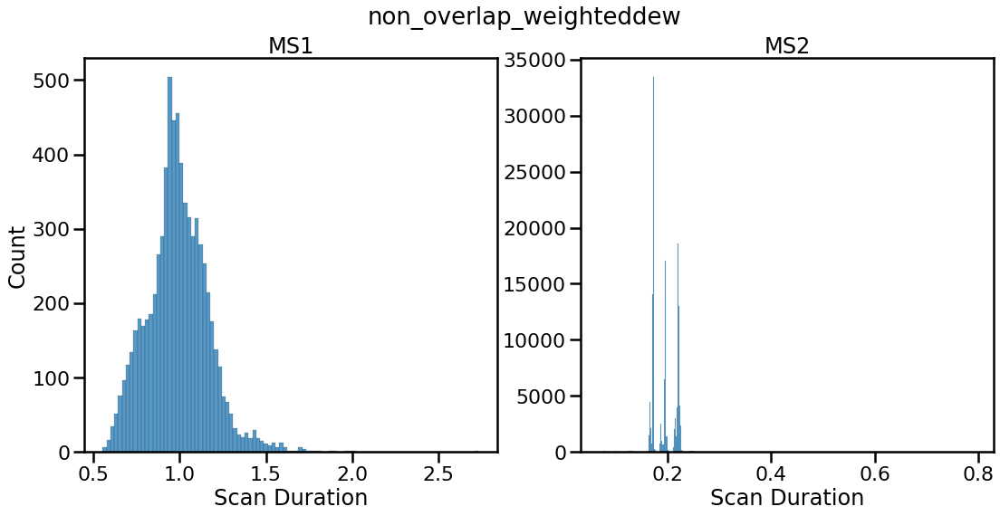

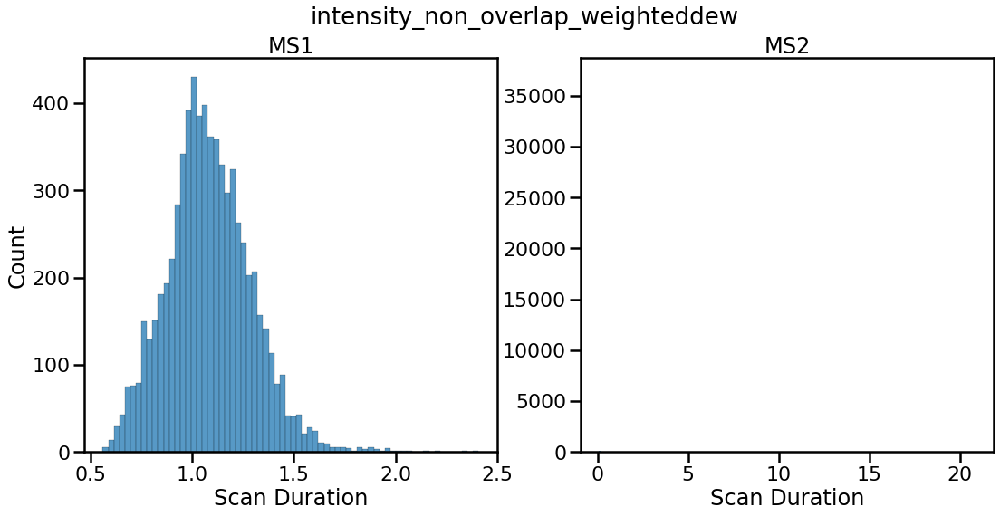

In [33]:
weighteddews = {"hard_roi_exclusion", "intensity_roi_exclusion", "non_overlap", "intensity_non_overlap"}
bio_repeat = 6
tech_repeat = 4

kwargs = {
    **fig_kwargs,
    "axis_kwargs" : {
        **fig_kwargs["axis_kwargs"],
        "legend_kwargs" : None
    },
    "suptitle_size" : 26
}

scan_avg = []

#avg times for fs of first six beers per each batch
mzmls = []
for batch_idx in range(1, 5):
    if(batch_idx == 1):
        batch_dir = os.path.join("C:\\", "Users", "mcbrider5002", "Desktop", "Workspace", "phd", "data", "CLMS", "20220706_DDAvsDIA")
    else:
        batch_dir = data_dir
    
    for fs_idx in range(1, 7):
        path = os.path.join(
            batch_dir, f"results_{batch_idx}", f"fullscan_beer{fs_idx}_0.mzML"
        )
        print(f"Loading: {path}")
        mzmls.append(path_or_mzml(path))
        
    scan_avg.append((f"fullscan ({batch_idx})", get_avg_scan_times(mzmls)))    
    fig, ax = seaborn_mzml_timing_hist(mzmls)

    case_kwargs = {
        **kwargs,
        "suptitle" : f"fullscan ({batch_idx})"
    }
    mpl_set_figure_style(fig, **case_kwargs)
    

#avg times for all 24 fs for each case in rep_diff experiment
for case_name, batch in rep_diff_case_names:
    mzmls = []
    true_name = case_name + ("_weighteddew" if case_name in weighteddews else "")
    
    for i in range(tech_repeat):
        for j in range(1, bio_repeat + 1):
            path = os.path.join(
                data_dir, f"results_{batch}", f"{case_name}_beer{j}_{i}.mzML"
            )
            print(f"Loading: {path}")
            mzmls.append(path_or_mzml(path))
            
    scan_avg.append((true_name + f" ({batch})", get_avg_scan_times(mzmls)))    
    fig, ax = seaborn_mzml_timing_hist(mzmls)
    
    case_kwargs = {
        **kwargs,
        "suptitle" : true_name
    }
    mpl_set_figure_style(fig, **case_kwargs)

In [34]:
print("\n".join(str(tup) for tup in scan_avg))

('fullscan (1)', {1: 0.5675318077517252})
('fullscan (2)', {1: 0.5491392397204263})
('fullscan (3)', {1: 0.5503289541050955})
('fullscan (4)', {1: 0.5491053182358541})
('topN (4)', {1: 0.5849024906613705, 2: 0.1928512796948782})
('topN_exclusion (2)', {1: 0.6278605036230499, 2: 0.19141827333247868})
('hard_roi_exclusion_weighteddew (4)', {1: 0.9587910519555122, 2: 0.19133693900393398})
('intensity_roi_exclusion_weighteddew (4)', {1: 0.9794621279564952, 2: 0.19048436132627217})
('non_overlap_weighteddew (2)', {1: 0.9904468722100661, 2: 0.19366222556005291})
('intensity_non_overlap_weighteddew (2)', {1: 1.0862609219699044, 2: 0.1938916282598448})


In [35]:
bio_repeat = 6
tech_repeat = 4

#avg times for all 24 fs for each case in rep_diff experiment
mzmls = []
for i in range(tech_repeat):
    for j in range(1, bio_repeat + 1):
        path = os.path.join(
            data_dir, f"results_2", f"intensity_non_overlap_beer{j}_{i}.mzML"
        )
        print(f"Loading: {path}")
        mzmls.append((i, j, path_or_mzml(path)))

print("Intensity Non-Overlap WeightedDEW Times by Injection")
for i, j, mzml in mzmls:
    times = get_avg_scan_times([mzml])
    inj_idx = bio_repeat * i + j
    print(
        f"{inj_idx} & {j} & {i+1} & {round(times[1], 3)} & {round(times[2], 3)} \\\\"
    )
    print("\\hline")

Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_0.mzML


2023-05-10 13:03:36.086 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6112 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_0.mzML


2023-05-10 13:03:38.322 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6201 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_0.mzML


2023-05-10 13:03:40.506 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6213 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer4_0.mzML


2023-05-10 13:03:45.690 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6259 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer5_0.mzML


2023-05-10 13:03:47.835 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6223 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer6_0.mzML


2023-05-10 13:03:49.970 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6117 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_1.mzML


2023-05-10 13:03:52.100 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6145 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_1.mzML


2023-05-10 13:03:54.256 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6135 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_1.mzML


2023-05-10 13:03:56.383 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6144 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer4_1.mzML


2023-05-10 13:04:00.062 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6177 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer5_1.mzML


2023-05-10 13:04:02.175 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6170 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer6_1.mzML


2023-05-10 13:04:04.223 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6011 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_2.mzML


2023-05-10 13:04:06.321 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6067 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_2.mzML


2023-05-10 13:04:08.429 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6052 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_2.mzML


2023-05-10 13:04:10.515 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6075 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer4_2.mzML


2023-05-10 13:04:14.272 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6104 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer5_2.mzML


2023-05-10 13:04:16.372 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6070 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer6_2.mzML


2023-05-10 13:04:18.430 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5916 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer1_3.mzML


2023-05-10 13:04:20.503 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5968 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer2_3.mzML


2023-05-10 13:04:22.556 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5977 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer3_3.mzML


2023-05-10 13:04:24.601 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5959 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer4_3.mzML


2023-05-10 13:04:28.554 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6017 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer5_3.mzML


2023-05-10 13:04:30.653 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5999 scans


Loading: C:\Users\mcbrider5002\Desktop\Workspace\phd\data\CLMS\20220719_multi_samples_main\results_2\intensity_non_overlap_beer6_3.mzML


2023-05-10 13:04:32.730 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5813 scans


Intensity Non-Overlap WeightedDEW Times by Injection
1 & 1 & 1 & 0.998 & 0.197 \\
\hline
2 & 2 & 1 & 1.004 & 0.193 \\
\hline
3 & 3 & 1 & 0.996 & 0.193 \\
\hline
4 & 4 & 1 & 0.975 & 0.193 \\
\hline
5 & 5 & 1 & 0.987 & 0.193 \\
\hline
6 & 6 & 1 & 1.03 & 0.195 \\
\hline
7 & 1 & 2 & 1.039 & 0.194 \\
\hline
8 & 2 & 2 & 1.039 & 0.193 \\
\hline
9 & 3 & 2 & 1.042 & 0.194 \\
\hline
10 & 4 & 2 & 1.032 & 0.193 \\
\hline
11 & 5 & 2 & 1.036 & 0.193 \\
\hline
12 & 6 & 2 & 1.101 & 0.195 \\
\hline
13 & 1 & 3 & 1.099 & 0.194 \\
\hline
14 & 2 & 3 & 1.11 & 0.194 \\
\hline
15 & 3 & 3 & 1.097 & 0.194 \\
\hline
16 & 4 & 3 & 1.086 & 0.193 \\
\hline
17 & 5 & 3 & 1.104 & 0.193 \\
\hline
18 & 6 & 3 & 1.194 & 0.195 \\
\hline
19 & 1 & 4 & 1.185 & 0.194 \\
\hline
20 & 2 & 4 & 1.172 & 0.194 \\
\hline
21 & 3 & 4 & 1.188 & 0.194 \\
\hline
22 & 4 & 4 & 1.156 & 0.193 \\
\hline
23 & 5 & 4 & 1.153 & 0.194 \\
\hline
24 & 6 & 4 & 1.281 & 0.196 \\
\hline


In [46]:
import numpy as np

def summarise_frags_by_intensity(evals):
    intensity_bins = [5000] + [10 ** i for i in range(4, 8)]
    ibin_labels = (
        [f"$5000-10^4$"] 
        + [f"$10^{i}-10^{i+1}$" for i in range(4, 7)]
        + [f"$\ge10^7$"]
    )
    intensity_frag_names = ["topN_exclusion", "non_overlap", "intensity_non_overlap"]
    frag_key = "times_fragmented"

    case_intensity_counts = {}
    for case_name in intensity_frag_names:
        eva = evals[case_name]
        report = eva.evaluation_report(min_intensity=0)
        intensities = np.amax(report["max_possible_intensity"], axis=0)
        counts = report[frag_key]

        intensity_counts = [[] for _ in intensity_bins]
        frags = np.stack([intensities, counts], axis=1)
        for intensity, count in frags:
            if(intensity < intensity_bins[0]):
                next

            ibin_idx = 0
            for ibin in intensity_bins[1:]:
                if(intensity > ibin):
                    ibin_idx += 1
                else:
                    break
            intensity_counts[ibin_idx].append(count)

        case_intensity_counts[case_name] = intensity_counts

    for i, ibin in enumerate(intensity_bins):
        row = ibin_labels[i]

        for case_name in intensity_frag_names:
            counts = case_intensity_counts[case_name][i]
            row += f" & {len(counts)} & {round(np.mean(counts), 2):.2f} & {np.median(counts)}"

        row += " \\\\"
        print(row)
    
    row = "Overall"
    for case_name in intensity_frag_names:
        case_counts = case_intensity_counts[case_name]
        row += (
            f" & {sum(len(c) for c in case_counts)}"
            + f" & {round(np.mean(np.concatenate(case_counts), axis=None), 2):.2f}"
            + f" & {np.median(np.concatenate(counts, axis=None))}"
        )
    print(row + "\\\\")
    
    print()
    for i, ibin in enumerate(intensity_bins):
        print(ibin_labels[i])
        for case_name in intensity_frag_names:
            counts = case_intensity_counts[case_name][i]
            print(f"{sum(missed == 0 for missed in counts)}/{len(counts)}")

In [47]:
summarise_frags_by_intensity(same_evals)

$5000-10^4$ & 133 & 5.26 & 5.0 & 226 & 18.06 & 10.0 & 232 & 19.89 & 12.0 \\
$10^4-10^5$ & 1219 & 8.92 & 7.0 & 1230 & 16.47 & 10.0 & 1217 & 17.55 & 10.0 \\
$10^5-10^6$ & 633 & 9.35 & 7.0 & 551 & 15.15 & 11.0 & 557 & 17.58 & 12.0 \\
$10^6-10^7$ & 136 & 11.05 & 9.0 & 120 & 17.92 & 13.5 & 121 & 19.88 & 16.0 \\
$\ge10^7$ & 22 & 37.64 & 24.0 & 16 & 71.94 & 38.0 & 16 & 83.69 & 39.5 \\
Overall & 2143 & 9.25 & 39.5 & 2143 & 16.79 & 39.5 & 2143 & 18.44 & 39.5\\

$5000-10^4$
2/133
9/226
9/232
$10^4-10^5$
0/1219
0/1230
1/1217
$10^5-10^6$
0/633
0/551
0/557
$10^6-10^7$
0/136
0/120
0/121
$\ge10^7$
0/22
0/16
0/16


In [48]:
summarise_frags_by_intensity(rep_diff_evals)

2023-05-10 13:25:51.506 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 6687 scans
2023-05-10 13:25:53.794 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 5795 scans
2023-05-10 13:25:55.947 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4789 scans
2023-05-10 13:25:58.085 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4655 scans
2023-05-10 13:26:00.182 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4260 scans
2023-05-10 13:26:02.253 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4000 scans
2023-05-10 13:26:04.347 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4191 scans
2023-05-10 13:26:09.752 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4380 scans
2023-05-10 13:26:11.802 | DEBUG    | mass_spec_utils.data_import.mzml:_load_file:166 - Loaded 4047 scans
2023-05-10 13:26:13.861 | DEBUG    | mass_spec_utils.da

$5000-10^4$ & 1087 & 2.07 & 1.0 & 1039 & 13.03 & 6.0 & 1118 & 13.99 & 7.0 \\
$10^4-10^5$ & 3421 & 6.29 & 4.0 & 3338 & 16.05 & 8.0 & 3277 & 16.66 & 8.0 \\
$10^5-10^6$ & 1687 & 11.10 & 8.0 & 1779 & 18.54 & 12.0 & 1777 & 20.21 & 13.0 \\
$10^6-10^7$ & 273 & 18.35 & 15.0 & 309 & 29.75 & 21.0 & 297 & 32.21 & 23.0 \\
$\ge10^7$ & 44 & 44.75 & 32.5 & 47 & 68.94 & 43.0 & 43 & 95.40 & 56.0 \\
Overall & 6512 & 7.60 & 56.0 & 6512 & 17.28 & 56.0 & 6512 & 18.40 & 56.0\\

$5000-10^4$
319/1087
132/1039
147/1118
$10^4-10^5$
249/3421
58/3338
60/3277
$10^5-10^6$
51/1687
19/1779
14/1777
$10^6-10^7$
0/273
1/309
0/297
$\ge10^7$
0/44
0/47
0/43
